Balasuriya Balasuriya

10899180

10899180@students.plymouth.ac.uk

In [ ]:
#Installing Python Reddit API Wrapper
!pip install praw

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.3/189.3 kB 8.5 MB/s eta 0:00:00


###Importing required Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
import spacy
import praw

In [ ]:
#Downloading stopword data set from nltk
nltk.download('stopwords')

#Downloading punkt tokenizer from nltk
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

### Task 1: Introduction to NLP and Data Collection

Reddit post gathering using praw

In [ ]:
#setting up API connection
user_agent = "Scraper 1.0 by /u/Small-Baseball-7194"
reddit = praw.Reddit(
    client_id="pt9Xq0EP5YuFPk2ZU90mTg",
    client_secret="e9XTlV_g_LUi8Mqum_Wm9h7Na6jOaA",
    user_agent=user_agent
)

print("Reddit instance created successfully!")

Reddit instance created successfully!


In [ ]:
headlines = []

#Retrieving reddit post titles
for submission in reddit.subreddit("technology").hot(limit=None):
    title = submission.title if submission.title else "No title"
    post_id = submission.id if submission.id else "No ID"

    headlines.append({"ID": post_id, "Headline": title})

df = pd.DataFrame(headlines)

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/l

In [ ]:
df.to_csv('Dataframe.csv', index=False)

In [ ]:
from google.colab import files

# Download the file
files.download('Dataframe.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Following data is gathered from subreddit  r/technology  which provide global news related to technology I have only extracted the title and the reddit id to do a sentimental analysis

In [ ]:
#Data frame shape
df.shape

(716, 2)

In [ ]:
df.head()

,ID,Headline
0,1hpz6rq,New evidence supports theories that Russia is ...
1,1hq6nj1,FaceBook and Instagram to unleash AI-generated...
2,1hqexxn,Never Forgive Them: Why everything digital fee...
3,1hpxxrk,US Treasury says Chinese hackers stole documen...
4,1hpvcsi,Refrigerators have gotten really freaking good...


# Task 2: Text Preprocessing and Tokenization

In [ ]:
#data stats
df.describe

<bound method NDFrame.describe of           ID                                           Headline
0    1hpz6rq  New evidence supports theories that Russia is ...
1    1hq6nj1  FaceBook and Instagram to unleash AI-generated...
2    1hqexxn  Never Forgive Them: Why everything digital fee...
3    1hpxxrk  US Treasury says Chinese hackers stole documen...
4    1hpvcsi  Refrigerators have gotten really freaking good...
..       ...                                                ...
711  1hcykx4  Sundar Pichai and Jeff Bezos head to Mar-a-Lag...
712  1hcylij  Intel Arc B580 review: The new $249 GPU champi...
713  1hcxnbb  AI enters Congress: Sexually explicit deepfake...
714  1hctz7s  Klarna stopped all hiring a year ago to replac...
715  1hckbgs  Firefox, one of the first “Do Not Track” suppo...

[716 rows x 2 columns]>

In [ ]:
#dataframe information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 716 entries, 0 to 715
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   ID        716 non-null    object
 1   Headline  716 non-null    object
dtypes: object(2)
memory usage: 11.3+ KB


In [ ]:
#checking NA valus
df.isnull().sum()

,0
ID,0
Headline,0


In [ ]:
#Removing dublicate values
df = df.drop_duplicates(subset='Headline')

In [ ]:
#dataframe shape after removing dublicates
df.shape

(712, 2)

In [ ]:
#Making a copyof the dataframe(If there were some errors occured)
df1= df.copy()

Stopword removal

In [ ]:
from nltk.corpus import stopwords

# Initialize stopwords
stop_words = set(stopwords.words('english'))

#Function to remove stopwords
def remove_stopwords(text):
    words = text.split()
    words = [word for word in words if word.lower() not in stop_words]
    return ' '.join(words)

#removing stopwords from reddit post titles
df.loc[:, 'Headline'] = df['Headline'].astype(str).apply(lambda x: remove_stopwords(x))

df.head()

,ID,Headline
0,1hpz6rq,New evidence supports theories Russia sabotagi...
1,1hq6nj1,FaceBook Instagram unleash AI-generated ‘users...
2,1hqexxn,Never Forgive Them: everything digital feels b...
3,1hpxxrk,US Treasury says Chinese hackers stole documen...
4,1hpvcsi,Refrigerators gotten really freaking good. Tha...


Special Charactor removal

In [ ]:
#Special charactor removal function
def remove_special_chars_and_emojis(text):
    text = re.sub(r'[^\w\s,]', '', text)
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    return text

# Apply the cleaning function to remove special characters and emojis

df.loc[:, 'Headline'] = df['Headline'].apply(lambda x: remove_special_chars_and_emojis(x))

In [ ]:
df.head()

,ID,Headline
0,1hpz6rq,New evidence supports theories Russia sabotagi...
1,1hq6nj1,FaceBook Instagram unleash AIgenerated users o...
2,1hqexxn,Never Forgive Them everything digital feels br...
3,1hpxxrk,US Treasury says Chinese hackers stole documen...
4,1hpvcsi,Refrigerators gotten really freaking good Than...


Cleaning text

In [ ]:
# Function to clean text
def clean_text(text):
    contractions = {
        r"\bwhat's\b": "what is",
        r"\bit's\b": "it is",
        r"\bhe's\b": "he is",
        r"\bshe's\b": "she is",
        r"\bthat's\b": "that is",
        r"\bwho's\b": "who is",
        r"\b've\b": " have",
        r"\bcan't\b": "cannot",
        r"\bn't\b": " not",
        r"\bi'm\b": "i am",
        r"\b're\b": " are",
        r"\b'd\b": " would",
        r"\b'll\b": " will",
        r"\b'scuse\b": " excuse"
    }

    # Convert to lowercase
    text = text.lower()

    # Replace contractions
    for contraction, replacement in contractions.items():
        text = re.sub(contraction, replacement, text)

    text = re.sub(r'\W', ' ', text)
    text = re.sub(r'\s+', ' ', text)
    text = text.strip()

    return text

# Apply the cleaning function to the 'Headline' column
df.loc[:, 'Headline'] = df['Headline'].apply(lambda x: clean_text(x))

# Display the updated DataFrame
df.head()

,ID,Headline
0,1hpz6rq,new evidence supports theories russia sabotagi...
1,1hq6nj1,facebook instagram unleash aigenerated users o...
2,1hqexxn,never forgive them everything digital feels br...
3,1hpxxrk,us treasury says chinese hackers stole documen...
4,1hpvcsi,refrigerators gotten really freaking good than...


Tokenization

In [ ]:
# loading spacy language model
nlp = spacy.load("en_core_web_sm")

# Tokenizing function using SpaCy
def tokenize_with_spacy(text):
    if isinstance(text, list):
        text = " ".join(text)
    doc = nlp(text)
    tokens = [token.text for token in doc]
    return tokens

# tokenization to the Headline column
df.loc[:, 'HeadlineTokens'] = df['Headline'].apply(tokenize_with_spacy)

df.head()

<ipython-input-84-7b598d33c9fa>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'HeadlineTokens'] = df['Headline'].apply(tokenize_with_spacy)


,ID,Headline,HeadlineTokens
0,1hpz6rq,new evidence supports theories russia sabotagi...,"[new, evidence, supports, theories, russia, sa..."
1,1hq6nj1,facebook instagram unleash aigenerated users o...,"[facebook, instagram, unleash, aigenerated, us..."
2,1hqexxn,never forgive them everything digital feels br...,"[never, forgive, them, everything, digital, fe..."
3,1hpxxrk,us treasury says chinese hackers stole documen...,"[us, treasury, says, chinese, hackers, stole, ..."
4,1hpvcsi,refrigerators gotten really freaking good than...,"[refrigerators, gotten, really, freaking, good..."


Lemmatization

In [ ]:
# Lemmatization function
def lemmatize_with_spacy(tokens):
    if isinstance(tokens, list):
        tokens = " ".join(tokens)
    doc = nlp(tokens)
    lemmatized_tokens = [token.lemma_ for token in doc]
    return lemmatized_tokens
#Lemmatizing Headline tokens and adding it to another seperate column called 'LemmatizedHeadlineTokens'
df.loc[:, 'LemmatizedHeadlineTokens'] = df['HeadlineTokens'].apply(lemmatize_with_spacy)

df.head()

<ipython-input-85-ffbf6a0d5ca7>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'LemmatizedHeadlineTokens'] = df['HeadlineTokens'].apply(lemmatize_with_spacy)


,ID,Headline,HeadlineTokens,LemmatizedHeadlineTokens
0,1hpz6rq,new evidence supports theories russia sabotagi...,"[new, evidence, supports, theories, russia, sa...","[new, evidence, support, theory, russia, sabot..."
1,1hq6nj1,facebook instagram unleash aigenerated users o...,"[facebook, instagram, unleash, aigenerated, us...","[facebook, instagram, unleash, aigenerate, use..."
2,1hqexxn,never forgive them everything digital feels br...,"[never, forgive, them, everything, digital, fe...","[never, forgive, they, everything, digital, fe..."
3,1hpxxrk,us treasury says chinese hackers stole documen...,"[us, treasury, says, chinese, hackers, stole, ...","[we, treasury, say, chinese, hacker, steal, do..."
4,1hpvcsi,refrigerators gotten really freaking good than...,"[refrigerators, gotten, really, freaking, good...","[refrigerator, gotten, really, freak, good, th..."


Combining words to a sentence

In [ ]:
#Word combining function
def lemmatize_with_spacy(tokens):
    if isinstance(tokens, list):
        tokens = " ".join(tokens)
    doc = nlp(tokens)
    lemmatized_tokens = [token.lemma_ for token in doc]
    return " ".join(lemmatized_tokens)

# Appling the function to the 'HeadlineTokens' column
df.loc[:, 'LemmatizedHeadline'] = df['LemmatizedHeadlineTokens'].apply(lemmatize_with_spacy)

df.head()

<ipython-input-86-ae6ebc22f192>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'LemmatizedHeadline'] = df['LemmatizedHeadlineTokens'].apply(lemmatize_with_spacy)


,ID,Headline,HeadlineTokens,LemmatizedHeadlineTokens,LemmatizedHeadline
0,1hpz6rq,new evidence supports theories russia sabotagi...,"[new, evidence, supports, theories, russia, sa...","[new, evidence, support, theory, russia, sabot...",new evidence support theory russia sabotage cr...
1,1hq6nj1,facebook instagram unleash aigenerated users o...,"[facebook, instagram, unleash, aigenerated, us...","[facebook, instagram, unleash, aigenerate, use...",facebook instagram unleash aigenerate user one...
2,1hqexxn,never forgive them everything digital feels br...,"[never, forgive, them, everything, digital, fe...","[never, forgive, they, everything, digital, fe...",never forgive they everything digital feel bre...
3,1hpxxrk,us treasury says chinese hackers stole documen...,"[us, treasury, says, chinese, hackers, stole, ...","[we, treasury, say, chinese, hacker, steal, do...",we treasury say chinese hacker steal document ...
4,1hpvcsi,refrigerators gotten really freaking good than...,"[refrigerators, gotten, really, freaking, good...","[refrigerator, gotten, really, freak, good, th...",refrigerator get really freak good thank jimmy...


Performing bigram and trigram

In [ ]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [ ]:
from nltk.tokenize import word_tokenize

#Function to make n-grams
def get_n_grams(text, n):
    if isinstance(text, str):
        tokens = nltk.word_tokenize(text)
        n_grams = zip(*[tokens[i:] for i in range(n)])
        return [" ".join(ngram) for ngram in n_grams]
    else:
        return []

# n-gram function for columns
def generate_ngrams(df, column_name, n):
    return df[column_name].apply(lambda x: get_n_grams(x, n))

# Generating bigrams and trigrams for the 'LemmatizedHeadline' column
df.loc[:, 'bigrams_LemmatizedHeadline'] = generate_ngrams(df, 'LemmatizedHeadline', 2)
df.loc[:, 'trigrams_LemmatizedHeadline'] = generate_ngrams(df, 'LemmatizedHeadline', 3)

df.head()

<ipython-input-88-cb58cc489736>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'bigrams_LemmatizedHeadline'] = generate_ngrams(df, 'LemmatizedHeadline', 2)
<ipython-input-88-cb58cc489736>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'trigrams_LemmatizedHeadline'] = generate_ngrams(df, 'LemmatizedHeadline', 3)


,ID,Headline,HeadlineTokens,LemmatizedHeadlineTokens,LemmatizedHeadline,bigrams_LemmatizedHeadline,trigrams_LemmatizedHeadline
0,1hpz6rq,new evidence supports theories russia sabotagi...,"[new, evidence, supports, theories, russia, sa...","[new, evidence, support, theory, russia, sabot...",new evidence support theory russia sabotage cr...,"[new evidence, evidence support, support theor...","[new evidence support, evidence support theory..."
1,1hq6nj1,facebook instagram unleash aigenerated users o...,"[facebook, instagram, unleash, aigenerated, us...","[facebook, instagram, unleash, aigenerate, use...",facebook instagram unleash aigenerate user one...,"[facebook instagram, instagram unleash, unleas...","[facebook instagram unleash, instagram unleash..."
2,1hqexxn,never forgive them everything digital feels br...,"[never, forgive, them, everything, digital, fe...","[never, forgive, they, everything, digital, fe...",never forgive they everything digital feel bre...,"[never forgive, forgive they, they everything,...","[never forgive they, forgive they everything, ..."
3,1hpxxrk,us treasury says chinese hackers stole documen...,"[us, treasury, says, chinese, hackers, stole, ...","[we, treasury, say, chinese, hacker, steal, do...",we treasury say chinese hacker steal document ...,"[we treasury, treasury say, say chinese, chine...","[we treasury say, treasury say chinese, say ch..."
4,1hpvcsi,refrigerators gotten really freaking good than...,"[refrigerators, gotten, really, freaking, good...","[refrigerator, gotten, really, freak, good, th...",refrigerator get really freak good thank jimmy...,"[refrigerator get, get really, really freak, f...","[refrigerator get really, get really freak, re..."


#Task 3: POS Tagging and Named Entity Recognition (NER)

In [ ]:
token_data = []

#POS analysis for each token
for text in df['LemmatizedHeadline']:
    doc = nlp(text)
    for token in doc:
        token_data.append({
            "Token": token.text,
            "POS": token.pos_,
            "POS_Explanation": spacy.explain(token.pos_)
        })

#assigning POS to a new dataframe
token_df = pd.DataFrame(token_data)

token_df.head()

,Token,POS,POS_Explanation
0,new,ADJ,adjective
1,evidence,NOUN,noun
2,support,NOUN,noun
3,theory,NOUN,noun
4,russia,PROPN,proper noun


In [ ]:
#length of token_df
len(token_df)

7539

Most common parts of speech

In [ ]:
from collections import Counter

# Counting each POS tag occurance
pos_counts = Counter(token_df['POS'])

# converting counts to a dataframe
pos_df = pd.DataFrame(pos_counts.items(), columns=['POS', 'Count']).sort_values(by='Count', ascending=False)

# display pos tags and counts
print(pos_df)

      POS  Count
1    NOUN   3156
2   PROPN   1592
3    VERB   1021
0     ADJ    907
4     NUM    309
5     ADV    216
6    PRON    112
8     AUX     89
7     ADP     72
9     DET     17
14   PART     13
10  SCONJ     10
11   INTJ      8
12      X      7
13  PUNCT      5
15  CCONJ      4
16    SYM      1


Named Entity Recognition

In [ ]:
#making an empty list
ner_data = []

# Loop through each row in the LemmatizedHeadline column
for text in df['LemmatizedHeadline']:
    doc = nlp(text)  # Processing the text with spacy
    for ent in doc.ents:
        # adding components to the empty list
        ner_data.append({
            "Text": text,
            "Entity": ent.text,
            "Label": ent.label_,
            "Explanation": spacy.explain(ent.label_)
        })

# Converting the dictionary to a dataframe
ner_df = pd.DataFrame(ner_data)

# display dataFrame
ner_df.head()

,Text,Entity,Label,Explanation
0,new evidence support theory russia sabotage cr...,russia,GPE,"Countries, cities, states"
1,we treasury say chinese hacker steal document ...,treasury,ORG,"Companies, agencies, institutions, etc."
2,we treasury say chinese hacker steal document ...,chinese,NORP,Nationalities or religious or political groups
3,refrigerator get really freak good thank jimmy...,jimmy carter,PERSON,"People, including fictional"
4,meta want fill social platform aigenerate bot ...,meta want fill social,PERSON,"People, including fictional"


# Task 4: Sentiment Analysis

In [ ]:
from textblob import TextBlob

# Function to analyze sentiment
def analyze_sentiment(text):
    polarity = TextBlob(text).sentiment.polarity
    if polarity > 0:
        return "Positive"
    elif polarity < 0:
        return "Negative"
    else:
        return "Neutral"

# Applying sentiment analysis function and making a seperate column for sentiments
df['SentimentofLemmatizedHeadline'] = df['LemmatizedHeadline'].apply(analyze_sentiment)

<ipython-input-93-a1ce620f702a>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SentimentofLemmatizedHeadline'] = df['LemmatizedHeadline'].apply(analyze_sentiment)


In [ ]:
df.head()

,ID,Headline,HeadlineTokens,LemmatizedHeadlineTokens,LemmatizedHeadline,bigrams_LemmatizedHeadline,trigrams_LemmatizedHeadline,SentimentofLemmatizedHeadline
0,1hpz6rq,New evidence supports theories Russia sabotagi...,"[New, evidence, supports, theories, Russia, sa...","[new, evidence, support, theory, Russia, sabot...",new evidence support theory Russia sabotage cr...,"[new evidence, evidence support, support theor...","[new evidence support, evidence support theory...",Positive
1,1hq6nj1,FaceBook Instagram unleash AIgenerated users o...,"[FaceBook, Instagram, unleash, AIgenerated, us...","[FaceBook, Instagram, unleash, AIgenerated, us...",FaceBook Instagram unleash AIgenerated user on...,"[FaceBook Instagram, Instagram unleash, unleas...","[FaceBook Instagram unleash, Instagram unleash...",Negative
2,1hpvcsi,Refrigerators gotten really freaking good Than...,"[Refrigerators, gotten, really, freaking, good...","[refrigerator, get, really, freak, good, thank...","refrigerator get really freak good thank , Jim...","[refrigerator get, get really, really freak, f...","[refrigerator get really, get really freak, re...",Positive
3,1hpxxrk,US Treasury says Chinese hackers stole documen...,"[US, Treasury, says, Chinese, hackers, stole, ...","[US, Treasury, say, chinese, hacker, steal, do...",US Treasury say chinese hacker steal document ...,"[US Treasury, Treasury say, say chinese, chine...","[US Treasury say, Treasury say chinese, say ch...",Positive
4,1hq1s7u,Meta wants fill social platforms AIgenerated b...,"[Meta, wants, fill, social, platforms, AIgener...","[Meta, want, fill, social, platform, AIgenerat...",Meta want fill social platform AIgenerated bot...,"[Meta want, want fill, fill social, social pla...","[Meta want fill, want fill social, fill social...",Positive


In [ ]:
# displaying sentiment counts
sentiment_counts = df['SentimentofLemmatizedHeadline'].value_counts()
print("Sentiment Distribution:")
print(sentiment_counts)

Sentiment Distribution:
SentimentofLemmatizedHeadline
Neutral     343
Positive    220
Negative    149
Name: count, dtype: int64


Sentiment Visualization

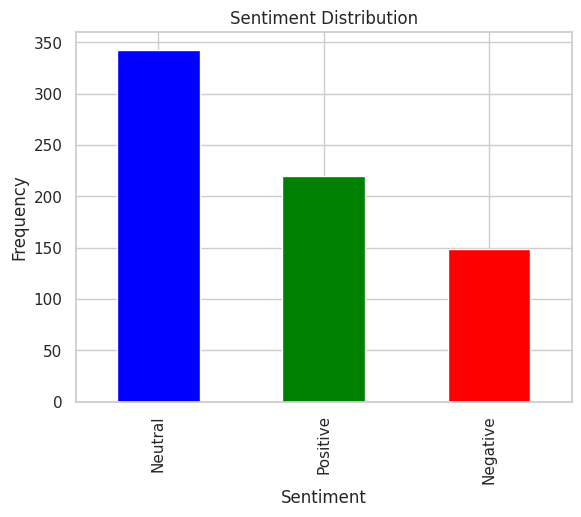

In [ ]:
# Ploting sentiment distribution
sentiment_counts.plot(kind='bar', color=['blue', 'green', 'red'])
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Frequency')
plt.show()

# Task 5: Topic Modeling

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# vectorizing the text data
tfidf_vectorizer = TfidfVectorizer(max_df=0.85, min_df=2, stop_words='english', ngram_range=(1, 2))
tfidf_matrix = tfidf_vectorizer.fit_transform(df['LemmatizedHeadline'])

# applying LDA for topic modeling
lda_model = LatentDirichletAllocation(n_components=3, random_state=42, learning_method='online')
lda_model.fit(tfidf_matrix)

# extracting topics and keywords
def extract_topics(model, feature_names, num_keywords):
    topic_keywords = {}
    for topic_idx, topic in enumerate(model.components_):
        top_keywords = [feature_names[i] for i in topic.argsort()[:-num_keywords - 1:-1]]
        topic_keywords[f"Topic {topic_idx+1}"] = top_keywords
    return topic_keywords

# displaying top 7 keywords for each topic
num_keywords = 7
feature_names = tfidf_vectorizer.get_feature_names_out()
topics_dict = extract_topics(lda_model, feature_names, num_keywords)

print("Identified Topics and Keywords:")
for topic, keywords in topics_dict.items():
    print(f"{topic}: {', '.join(keywords)}")

#assigning topics to each headline
topic_probabilities = lda_model.transform(tfidf_matrix)
df['Assigned_Topic'] = topic_probabilities.argmax(axis=1) + 1

#mapping topic numbers to corresponding keywords
topic_mapping = {idx + 1: ', '.join(keywords) for idx, keywords in enumerate(topics_dict.values())}
df['Topic_Keywords'] = df['Assigned_Topic'].map(topic_mapping)

# displaying DataFrame with assigned topics and keywords
print(df[['LemmatizedHeadline', 'Assigned_Topic', 'Topic_Keywords']].head())

Identified Topics and Keywords:
Topic 1: ai, google, nvidia, device, broadcom, help, use
Topic 2: new, trump, company, year, tiktok, ai, apple
Topic 3: ai, china, say, test, security, robot, app
                                  LemmatizedHeadline  Assigned_Topic  \
0  new evidence support theory russia sabotage cr...               1   
1  facebook instagram unleash aigenerate user one...               2   
2  never forgive they everything digital feel bre...               2   
3  we treasury say chinese hacker steal document ...               3   
4  refrigerator get really freak good thank jimmy...               3   

                                    Topic_Keywords  
0  ai, google, nvidia, device, broadcom, help, use  
1     new, trump, company, year, tiktok, ai, apple  
2     new, trump, company, year, tiktok, ai, apple  
3       ai, china, say, test, security, robot, app  
4       ai, china, say, test, security, robot, app  


<ipython-input-96-01be1c8b5feb>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Assigned_Topic'] = topic_probabilities.argmax(axis=1) + 1
<ipython-input-96-01be1c8b5feb>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Topic_Keywords'] = df['Assigned_Topic'].map(topic_mapping)


In [ ]:
df.head()

,ID,Headline,HeadlineTokens,LemmatizedHeadlineTokens,LemmatizedHeadline,bigrams_LemmatizedHeadline,trigrams_LemmatizedHeadline,SentimentofLemmatizedHeadline,Assigned_Topic,Topic_Keywords
0,1hpz6rq,new evidence supports theories russia sabotagi...,"[new, evidence, supports, theories, russia, sa...","[new, evidence, support, theory, russia, sabot...",new evidence support theory russia sabotage cr...,"[new evidence, evidence support, support theor...","[new evidence support, evidence support theory...",Positive,1,"ai, google, nvidia, device, broadcom, help, use"
1,1hq6nj1,facebook instagram unleash aigenerated users o...,"[facebook, instagram, unleash, aigenerated, us...","[facebook, instagram, unleash, aigenerate, use...",facebook instagram unleash aigenerate user one...,"[facebook instagram, instagram unleash, unleas...","[facebook instagram unleash, instagram unleash...",Negative,2,"new, trump, company, year, tiktok, ai, apple"
2,1hqexxn,never forgive them everything digital feels br...,"[never, forgive, them, everything, digital, fe...","[never, forgive, they, everything, digital, fe...",never forgive they everything digital feel bre...,"[never forgive, forgive they, they everything,...","[never forgive they, forgive they everything, ...",Negative,2,"new, trump, company, year, tiktok, ai, apple"
3,1hpxxrk,us treasury says chinese hackers stole documen...,"[us, treasury, says, chinese, hackers, stole, ...","[we, treasury, say, chinese, hacker, steal, do...",we treasury say chinese hacker steal document ...,"[we treasury, treasury say, say chinese, chine...","[we treasury say, treasury say chinese, say ch...",Positive,3,"ai, china, say, test, security, robot, app"
4,1hpvcsi,refrigerators gotten really freaking good than...,"[refrigerators, gotten, really, freaking, good...","[refrigerator, gotten, really, freak, good, th...",refrigerator get really freak good thank jimmy...,"[refrigerator get, get really, really freak, f...","[refrigerator get really, get really freak, re...",Positive,3,"ai, china, say, test, security, robot, app"


In [ ]:
# counting unique topics and their count
topic_counts = df['Assigned_Topic'].value_counts()

# displaying the unique topics and their counts
print("Unique Topics and Their Counts:")
print(topic_counts)

Unique Topics and Their Counts:
Assigned_Topic
2    300
3    216
1    196
Name: count, dtype: int64


In [ ]:
# mapping labels to keywords
print("Topic Label to Keywords Mapping:")
for topic_label, keywords in topic_mapping.items():
    print(f"Label {topic_label}: {keywords}")

Topic Label to Keywords Mapping:
Label 1: ai, google, nvidia, device, broadcom, help, use
Label 2: new, trump, company, year, tiktok, ai, apple
Label 3: ai, china, say, test, security, robot, app


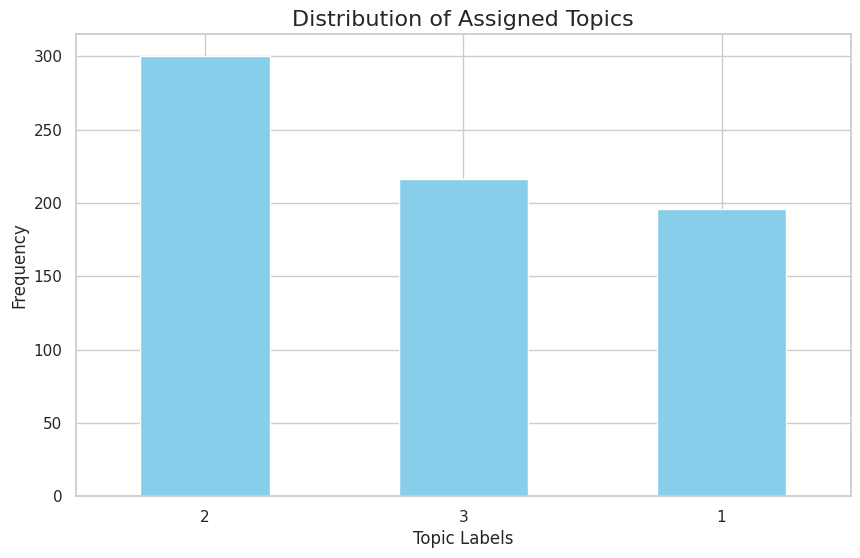

In [ ]:
# plotting the bar graph
plt.figure(figsize=(10, 6))
topic_counts.plot(kind='bar', color='skyblue')

# adding titles and labels
plt.title('Distribution of Assigned Topics', fontsize=16)
plt.xlabel('Topic Labels', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# displaying the graph
plt.xticks(rotation=0)
plt.show()

# Task 6: Stylometric Analysis and Visualization

PCA analysis for LemmatizedHeadline column

Most common 50 words

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

#stylometric Features extraction
vectorizer1 = CountVectorizer(analyzer='word', stop_words='english', max_features=50)
X = vectorizer1.fit_transform(df['LemmatizedHeadline']).toarray()

#display extracted features
feature_names = vectorizer1.get_feature_names_out()
print("Extracted Features (Top 50 words from LemmatizedHeadline):")
print(feature_names)

# Checking the shape of the resulting matrix
print(f"\nFeature matrix shape: {X.shape}")

Extracted Features (Top 50 words from LemmatizedHeadline):
['000' '10' 'ai' 'amazon' 'app' 'apple' 'ban' 'big' 'billion' 'change'
 'china' 'chinese' 'chip' 'come' 'company' 'court' 'datum' 'drone'
 'google' 'gpu' 'internet' 'launch' 'law' 'make' 'medium' 'meta'
 'microsoft' 'million' 'new' 'nvidia' 'openai' 'plan' 'power' 'report'
 'robot' 'say' 'security' 'social' 'target' 'tech' 'technology' 'test'
 'tiktok' 'trump' 'use' 'user' 'work' 'world' 'year' 'youtube']

Feature matrix shape: (712, 50)


Most 50 important words

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

#using TF-IDF Vectorizer
vectorizer2 = TfidfVectorizer(stop_words='english', max_features=50)
X_tfidf = vectorizer2.fit_transform(df['LemmatizedHeadline']).toarray()

# Retrieve the feature names
top_words = vectorizer2.get_feature_names_out()

# displaying the most important words
print("Top 50 Important Words (Based on TF-IDF) from LemmatizedHeadline:")
print(top_words)

# display the shape of the resulting matrix
print(f"\nTF-IDF Feature Matrix Shape: {X_tfidf.shape}")

Top 50 Important Words (Based on TF-IDF) from LemmatizedHeadline:
['000' '10' 'ai' 'amazon' 'app' 'apple' 'ban' 'big' 'billion' 'change'
 'china' 'chinese' 'chip' 'come' 'company' 'court' 'datum' 'drone'
 'google' 'gpu' 'internet' 'launch' 'law' 'make' 'medium' 'meta'
 'microsoft' 'million' 'new' 'nvidia' 'openai' 'plan' 'power' 'report'
 'robot' 'say' 'security' 'social' 'target' 'tech' 'technology' 'test'
 'tiktok' 'trump' 'use' 'user' 'work' 'world' 'year' 'youtube']

TF-IDF Feature Matrix Shape: (712, 50)


PCA,K-Means cluster and the scatterplot for Most common 50 words

In [ ]:
from sklearn.decomposition import PCA

#principal component analysis
pca1 = PCA(n_components=2)
X_pca1 = pca1.fit_transform(X)

In [ ]:
#K-means clustering
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state=42)
df['HeadlineCluster1'] = kmeans.fit_predict(X)

<ipython-input-104-01c9894e1869>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['HeadlineCluster1'] = kmeans.fit_predict(X)


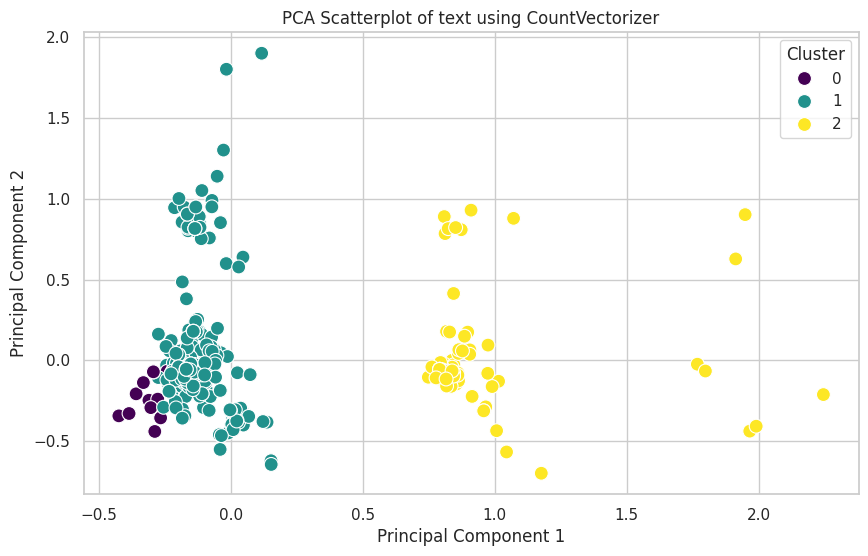

In [ ]:
#PCA1 Scatterplot using countervectorizer
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca1[:, 0], y=X_pca1[:, 1], hue=df['HeadlineCluster1'], palette='viridis', s=100)
plt.title('PCA Scatterplot of text using CountVectorizer')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

PCA,K-Means cluster and the scatterplot for Most important words

In [ ]:
#principal component analysis
pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(X_tfidf)

In [ ]:
#K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['HeadlineCluster2'] = kmeans.fit_predict(X_tfidf)

<ipython-input-107-12eb2514e090>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['HeadlineCluster2'] = kmeans.fit_predict(X_tfidf)


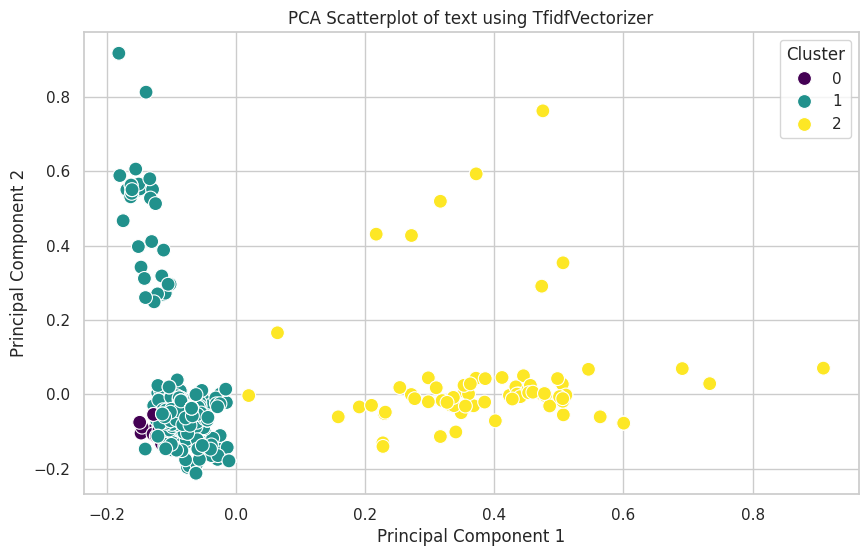

In [ ]:
#PCA2 Scatterplot using tf-idf
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca2[:, 0], y=X_pca2[:, 1], hue=df['HeadlineCluster1'], palette='viridis', s=100)
plt.title('PCA Scatterplot of text using TfidfVectorizer')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

Comparison of the two plots

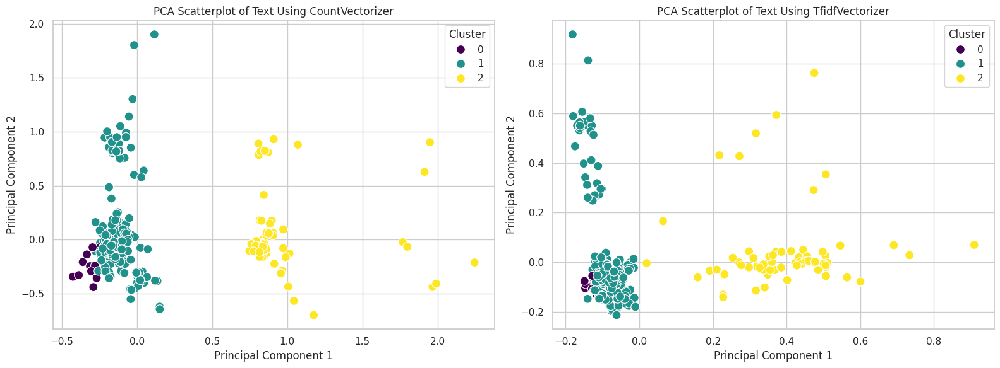

In [ ]:
#creating two plots together for better visualization

#creating the figure
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

#PCA Scatterplot for CountVectorizer
sns.scatterplot(x=X_pca1[:, 0], y=X_pca1[:, 1], hue=df['HeadlineCluster1'], palette='viridis', s=100, ax=axes[0])
axes[0].set_title('PCA Scatterplot of Text Using CountVectorizer')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')
axes[0].legend(title='Cluster')

#PCA Scatterplot for TfidfVectorizer
sns.scatterplot(x=X_pca2[:, 0], y=X_pca2[:, 1], hue=df['HeadlineCluster1'], palette='viridis', s=100, ax=axes[1])
axes[1].set_title('PCA Scatterplot of Text Using TfidfVectorizer')
axes[1].set_xlabel('Principal Component 1')
axes[1].set_ylabel('Principal Component 2')
axes[1].legend(title='Cluster')

#layout adjestment
plt.tight_layout()
plt.show()

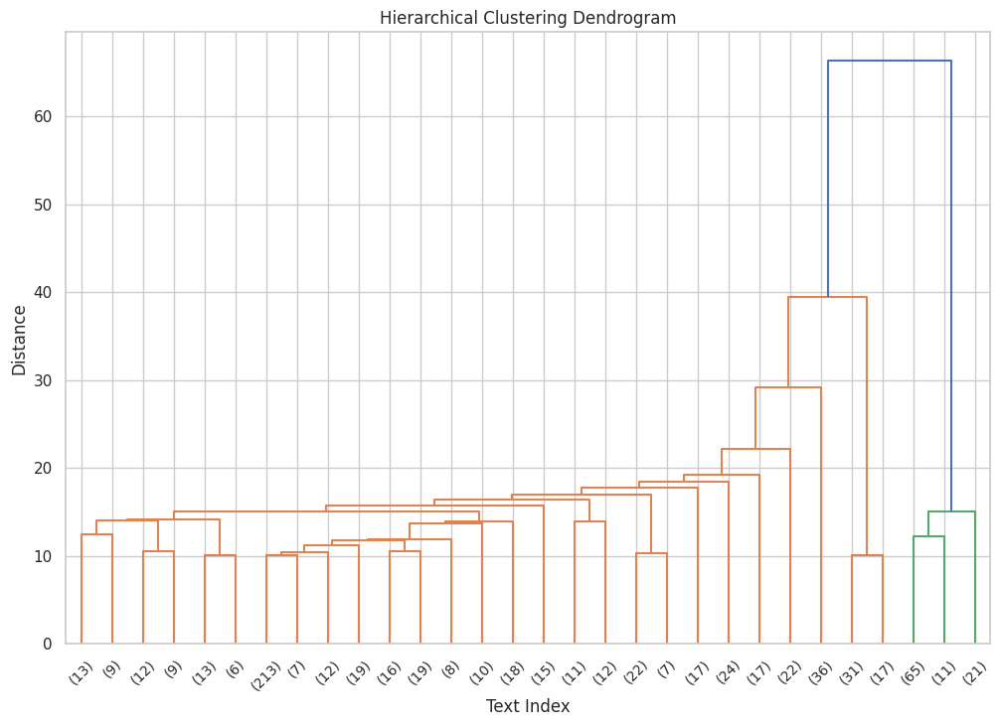

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import dendrogram, linkage

#Extracting features from the 'LemmatizedHeadline' column
vectorizer = CountVectorizer(analyzer='word', stop_words='english', max_features=50)
X = vectorizer.fit_transform(df['LemmatizedHeadline']).toarray()

#Calculating cosine similarity matrix
similarity_matrix = cosine_similarity(X)
distance_matrix = 1 - similarity_matrix

#Performing hierarchical clustering
linked = linkage(distance_matrix, method='ward')

#Ploting the dendrogram
plt.figure(figsize=(12, 8))
dendrogram(linked,
           labels=df['LemmatizedHeadline'].values,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True,
           truncate_mode='lastp',
           p=30
           )

#adding labels to the ploy
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Text Index')
plt.ylabel('Distance')

# Displaying the plot
plt.show()

# Task 7: Document Clustering with Word2Vec or Doc2Vec

Finding similarities amoung sentences

In [ ]:
from sklearn.manifold import TSNE
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize

# Seting the visualization style
sns.set(style="whitegrid")

# Preprocessing the teaxt
def tokenize_text(text):
    return word_tokenize(text.lower())

# Training word2vec tokenizer for LemmatizedHeadline column
word2vec_model = Word2Vec(sentences=df['LemmatizedHeadline'].apply(tokenize_text), vector_size=50, window=5, min_count=1, workers=4)

#Creating document vectors by averaging word embeddings
def create_average_vector(tokens, model):
    # Average word embeddings for valid tokens in the model
    valid_tokens = [token for token in tokens if token in model.wv]
    if not valid_tokens:
        return np.zeros(50)
    return np.mean([model.wv[token] for token in valid_tokens], axis=0)

# Applying the function to create document vectors for each headline
df['doc_vector'] = df['LemmatizedHeadline'].apply(lambda x: create_average_vector(tokenize_text(x), word2vec_model))

# Converting document vectors to a feature matrix
doc_vectors = np.array(list(df['doc_vector']))

# Applying K-Means Clustering to the document vectors
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['cluster'] = kmeans.fit_predict(doc_vectors)

# dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
reduced_features = tsne.fit_transform(doc_vectors)

<ipython-input-111-dc8d6dbebcb5>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['doc_vector'] = df['LemmatizedHeadline'].apply(lambda x: create_average_vector(tokenize_text(x), word2vec_model))
<ipython-input-111-dc8d6dbebcb5>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cluster'] = kmeans.fit_predict(doc_vectors)


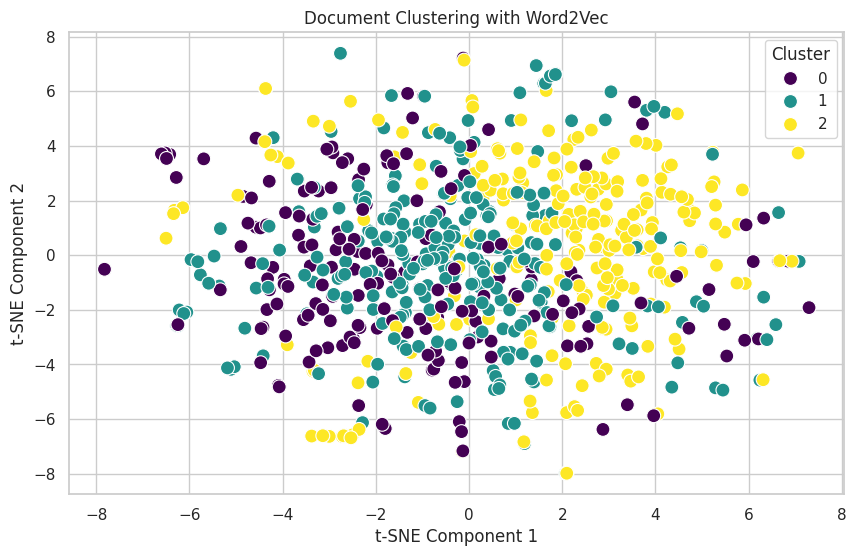

In [ ]:
# plotting the Clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x=reduced_features[:, 0], y=reduced_features[:, 1], hue=df['cluster'], palette="viridis", s=100)
plt.title("Document Clustering with Word2Vec")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title="Cluster")
plt.show()

In [ ]:
# Displaying the clustered documents
print("\nClustered Documents:")
for cluster_id in range(n_clusters):
    print(f"\nCluster {cluster_id}:")
    cluster_texts = df[df['cluster'] == cluster_id]['LemmatizedHeadline'].tolist()  # Use 'LemmatizedHeadline'
    for text in cluster_texts:
        print(f" - {text}")


Clustered Documents:

Cluster 0:
 - new evidence support theory russia sabotage critical digital infrastructure
 - we treasury say chinese hacker steal document major incident
 - we treasury say hack china major incident
 - russia vow retaliation censorship telegram block propaganda outlet
 - volkswagen leak expose location datum 800 000 electric car leak also include email address phone number driver case der spiegel report
 - china hack treasury dept major breach we say
 - south korea inspect boeing aircraft struggle find cause plane crash kill 179
 - late cpu sale report show ryzen 7 9800x3d lead race intel nowhere near top 10
 - cisco confirm authenticity datum second leak
 - major incident chinabacke hacker breach we treasury workstation
 - unprotecte vw datum expose location 800 000 evs
 - second jeju air plane experience land gear malfunction boeing model involve
 - manta ray inspire fast swimming robot well water filter
 - chinese hacker behind major incident us treasury docum

In [ ]:
# Geting the cluster centers
cluster_centers = kmeans.cluster_centers_
print("Cluster Centers (average of document vectors for each cluster):")
print(cluster_centers)

Cluster Centers (average of document vectors for each cluster):
[[ 5.5596110e-04 -2.2599589e-04 -1.8883486e-04  4.4999822e-04
   5.0748384e-04  9.9922414e-04  6.7946559e-04  1.8274649e-03
  -1.1127519e-03  6.7543430e-04 -1.2641450e-03 -4.6348781e-04
  -4.0133609e-04  1.6000828e-03 -1.9769894e-04  5.1838288e-04
  -2.2319052e-04 -2.4734461e-04  9.9772983e-04 -1.1567783e-03
  -1.2422147e-03  6.2898849e-05  8.2677824e-04  3.6388746e-04
   4.2142998e-04 -3.5697885e-05 -1.5598101e-03  2.8172793e-04
   1.4111795e-04  6.6119357e-04  2.1381006e-03  1.4366960e-03
  -1.0729324e-03  1.3414673e-03 -1.0883822e-03  2.0263228e-03
   5.7090964e-04  4.7175615e-04  1.2132309e-03 -1.2309486e-03
   1.6972547e-03 -1.1294691e-03 -1.4642584e-03 -1.7447746e-05
   2.0575994e-03  2.2787115e-04  1.6868715e-04 -2.1816618e-03
   1.0015260e-03 -6.8433664e-04]
 [-1.0321762e-03 -2.1266460e-05 -9.6151337e-04  1.3472774e-04
  -4.8954389e-06 -4.5572786e-04  5.9726328e-04  9.2627649e-04
  -1.7563157e-03 -4.0241377e-04 -4.

In [ ]:
# function to the top words for each cluster center
def get_top_words_for_cluster(cluster_center, model, n_top_words=10):
    # Calculating similarity between each word's vector and the cluster center
    word_similarities = {}
    for word in model.wv.index_to_key:
        word_similarities[word] = np.dot(model.wv[word], cluster_center)
    # Sort words by their similarity to the cluster center
    sorted_words = sorted(word_similarities.items(), key=lambda x: x[1], reverse=True)
    top_words = [word for word, _ in sorted_words[:n_top_words]]
    return top_words

# For each cluster center, find the top relevant words
for i, center in enumerate(cluster_centers):
    top_words = get_top_words_for_cluster(center, word2vec_model)
    print(f"Cluster {i} Top Words: {', '.join(top_words)}")

Cluster 0 Top Words: merit, million, active, journalist, valley, 10tolinux, performance, robot, massive, netflix
Cluster 1 Top Words: year, faircado, detail, affiliate, ssd, lastpass, first, plan, vogue, urge
Cluster 2 Top Words: ai, enable, law, big, chatgpt, new, china, ssd, power, bluesky


In [ ]:
# Counting how many documents are in each cluster
cluster_counts = df['cluster'].value_counts()

# Displaying the counts of documents in each cluster
print("Number of documents in a cluster:")
print(cluster_counts)

Number of documents in a cluster:
cluster
1    279
2    248
0    185
Name: count, dtype: int64


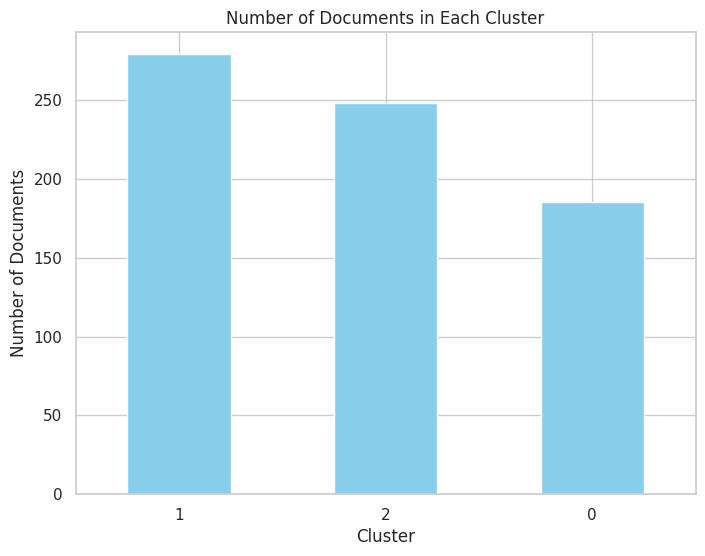

In [ ]:
# makinge a bar graph
plt.figure(figsize=(8, 6))
cluster_counts.plot(kind='bar', color='skyblue')
plt.title("Number of Documents in Each Cluster")
plt.xlabel("Cluster")
plt.ylabel("Number of Documents")
plt.xticks(rotation=0)
plt.show()

# Task 8: Dependency Parsing and Advanced Structures

This code reads sentences, analyzes their grammatical relationships, and prints out detailed information about each word’s role in the sentence. It also shows a visual diagram to make it easier to understand how words in the sentence are connected.

In [ ]:
from spacy import displacy

# Defining the function to parse a sentence and return dependency details
def analyze_dependencies(text):
    # Processing the sentence using spaCy's NLP pipeline
    doc = nlp(text)
    parsed_info = []
    for token in doc:
        parsed_info.append({
            "Word": token.text,
            "Dependency": token.dep_,
            "Head": token.head.text,
            "POS": token.pos_
        })
    # Converting the parsed information into a DataFrame
    return pd.DataFrame(parsed_info)

In [ ]:
# Printing dependency parsing for all sentences
print("Dependency Parsing Results for All Sentences:")

# Looping through all sentences in the 'LemmatizedHeadline' column
for idx, sentence in enumerate(df['LemmatizedHeadline']):
    print(f"\nSentence {idx + 1}: {sentence}")
    print(analyze_dependencies(sentence))

Streaming output truncated to the last 5000 lines.
6       user   compound  germany  PROPN
7      spain   compound  germany  PROPN
8    germany       dobj   delete  PROPN

Sentence 340: we finalize us47 bln chip act subsidy samsung electronic
         Word Dependency        Head    POS
0          we      nsubj    finalize   PRON
1    finalize       ROOT    finalize   VERB
2        us47        dep    finalize  PROPN
3         bln       nmod        chip  PROPN
4        chip   compound         act  PROPN
5         act   compound     subsidy  PROPN
6     subsidy   compound  electronic  PROPN
7     samsung   compound  electronic  PROPN
8  electronic       dobj    finalize    ADJ

Sentence 341: certain type gaming provide substantial benefit mental wellbeing
          Word Dependency       Head   POS
0      certain       amod     gaming   ADJ
1         type   compound     gaming  NOUN
2       gaming      nsubj    provide  NOUN
3      provide       ROOT    provide  VERB
4  substantial       a

In [ ]:
# Visualizing the dependency parsing for all sentences
print("\nVisualizing Dependency Structures...")

for idx, sentence in enumerate(df['LemmatizedHeadline']):
    doc = nlp(sentence)
    print(f"\nVisualizing Sentence {idx + 1}: {sentence}")
    displacy.render(doc, style="dep", jupyter=True, options={"distance": 90})


Visualizing Dependency Structures...

Visualizing Sentence 1: new evidence support theory russia sabotage critical digital infrastructure



Visualizing Sentence 2: facebook instagram unleash aigenerate user one ask meta seem less less interested social aspect social medium



Visualizing Sentence 3: never forgive they everything digital feel break seem keep get bad



Visualizing Sentence 4: we treasury say chinese hacker steal document major incident



Visualizing Sentence 5: refrigerator get really freak good thank jimmy carter underrated way energy efficiency make life well climate progress possible



Visualizing Sentence 6: meta want fill social platform aigenerate bot platform decay come social medium fast



Visualizing Sentence 7: we treasury say hack china major incident



Visualizing Sentence 8: russia vow retaliation censorship telegram block propaganda outlet



Visualizing Sentence 9: trump former fcc head ajit pai ask supreme court uphold tiktok ban trump former fcc head move away presidentelect issue



Visualizing Sentence 10: ai might start sell choice make they study warn



Visualizing Sentence 11: breakthrough wearable technology turn body heat electricity



Visualizing Sentence 12: volkswagen leak expose location datum 800 000 electric car leak also include email address phone number driver case der spiegel report



Visualizing Sentence 13: developer fire entire team ai end search engineer linkedin



Visualizing Sentence 14: china hack treasury dept major breach we say



Visualizing Sentence 15: south korea inspect boeing aircraft struggle find cause plane crash kill 179



Visualizing Sentence 16: transit system turn aipowere camera catch driver block bus lane



Visualizing Sentence 17: late cpu sale report show ryzen 7 9800x3d lead race intel nowhere near top 10



Visualizing Sentence 18: illegal sport stream crackdown put major piracy site pause



Visualizing Sentence 19: the psp one first machine hardware allow play proper console game go developer celebrate 20 year sonys handheld



Visualizing Sentence 20: cisco confirm authenticity datum second leak



Visualizing Sentence 21: major incident chinabacke hacker breach we treasury workstation



Visualizing Sentence 22: facebook think ai bot new social medium friend



Visualizing Sentence 23: nato plan build satellite link backups undersea cable recent cable damage incident shine spotlight project heist alliance want build system seamlessly switch undersea cable satellite case disruption



Visualizing Sentence 24: unprotecte vw datum expose location 800 000 evs



Visualizing Sentence 25: nvidia believe robotic market explode like chatgpt company pivot power humanoid robotic ai chip experience stiffen competition



Visualizing Sentence 26: rightwe figure allege censorship x amid visa controversy



Visualizing Sentence 27: second jeju air plane experience land gear malfunction boeing model involve



Visualizing Sentence 28: manta ray inspire fast swimming robot well water filter



Visualizing Sentence 29: samsung brace another tough year chip woe persist



Visualizing Sentence 30: fda approve first generic oncedaily glp1 injection low blood sugar patient type 2 diabetes



Visualizing Sentence 31: chinese hacker behind major incident us treasury document steal



Visualizing Sentence 32: us telco luman say network clear chinas salt typhoon hacker



Visualizing Sentence 33: dram price expect decline early 2025 impacting pc server gpu vram market



Visualizing Sentence 34: israel build ai factory war unleash gaza years gaza war israel transform intelligence unit ai test ground trigger debate among top commander whether human sufficiently loop



Visualizing Sentence 35: cold war mystery jimmy carter save space shuttle ar solve mystery go directly primary sourcethe president himself



Visualizing Sentence 36: 10 amazing technology development 2024



Visualizing Sentence 37: mine old datum nasa voyager 2 solve several uranus mystery



Visualizing Sentence 38: supermarket grape spark quantum technology revolution



Visualizing Sentence 39: trump say h1b visa program great amid maga feud tech worker I always favor visa that s they many h1b visa property



Visualizing Sentence 40: parent openai whistleblower hire private investigator sf death report



Visualizing Sentence 41: passkey technology elegant its definitely usable security time holiday techsupport session here know passkey



Visualizing Sentence 42: we treasury say target china statesponsore cyberattack



Visualizing Sentence 43: nvidia bet big robotic jetson thor next move



Visualizing Sentence 44: china unveil future highspeed rail nextgen prototype



Visualizing Sentence 45: nvidia close acquisition israeli software startup runai



Visualizing Sentence 46: million android smartphone quietly enlist one big crowdsource navigation project ever



Visualizing Sentence 47: samsung pour additional 181 m rainbow robotic eye future



Visualizing Sentence 48: 2025 exciting year space mission



Visualizing Sentence 49: apple meta go war interoperability vs privacy techcrunch



Visualizing Sentence 50: silicon sovereignty advanced chip redefine global dominance



Visualizing Sentence 51: welcome femosphere late dark toxic corner internet woman



Visualizing Sentence 52: historymake probe achieve closestever approach sun



Visualizing Sentence 53: researcher successfully train robot perform surgery watch video development could help address loom shortage surgeon we



Visualizing Sentence 54: brazil yanks temp work visas china byd traffic claim



Visualizing Sentence 55: chaos computer club ccc support three hacker explain detail 37c3 polish rail vehicle manufacturer newag manipulate train way could repair company workshop



Visualizing Sentence 56: unsung hero behind nvidias ai revolution ibiden race meet explosive demand



Visualizing Sentence 57: ai robot enter public worldwith mix result



Visualizing Sentence 58: trump tell scotus plan make deal save tiktok tiktok ban could delay consummate dealmaker trump get way



Visualizing Sentence 59: chinese ebook reader boox ditch gpt statecensore china llm push propaganda



Visualizing Sentence 60: nvidias defeature h20 gpu sell surprisingly well china 50 increase every quarter sanctionscompliant gpu chinese ai customer



Visualizing Sentence 61: bytedance plan spend 7 billion nvidia chip next year



Visualizing Sentence 62: ai data center reportedly cause power problem residential area decrease power quality home near datum center cause reduce lifespan electrical appliance



Visualizing Sentence 63: meta envisage social medium fill aigenerate user



Visualizing Sentence 64: lg reveal world first bendable 5k2k gaming monitor ultragear 45gx990a lg go flatscreen 900r curve monitor its also huge andlikelyhugely expensive



Visualizing Sentence 65: doctor say ai introduce slop patient care early testing demonstrate result could disastrous patient



Visualizing Sentence 66: new social contract



Visualizing Sentence 67: learn worldclass double bass give ct



Visualizing Sentence 68: ai tool may soon manipulate people online decisionmake say researcher



Visualizing Sentence 69: biden administration propose new cybersecurity rule limit impact healthcare datum leak



Visualizing Sentence 70: att say network clear salt typhoon hack



Visualizing Sentence 71: combinatorbacke kalshi shut bet fate luigi mangione receive notice regulator



Visualizing Sentence 72: new research show massive spending toxic content moderation fail address polarizationsocial medium company instead design well platform give user control choice



Visualizing Sentence 73: we need dramatic social technological change societal collapse inevitable



Visualizing Sentence 74: att verizon say network clear salt typhoon intrusion att say individual foreign intelligence interest target



Visualizing Sentence 75: massive chinese campaign give beijing unprecedented access private text phone conversation unknown number americans



Visualizing Sentence 76: scientist discover goldilock zone dna organization open new door drug development



Visualizing Sentence 77: nvidia supplier ibiden weigh fast expansion ai demand



Visualizing Sentence 78: aaa video game struggle keep skyrocket cost realistic graphic meanwhile gamer preference evolve towards title robust social feature



Visualizing Sentence 79: microsoft face ftc scrutiny allege antitrust practice federal cybersecurity deal



Visualizing Sentence 80: eu law mandate universal charger device come force



Visualizing Sentence 81: donald trump urge us supreme court delay tiktok ban



Visualizing Sentence 82: yike average american spend 25 month phone 2024



Visualizing Sentence 83: nvidia bets robotic drive future growth



Visualizing Sentence 84: cyber attack italys foreign ministry airport claim prorussian hacker group



Visualizing Sentence 85: apple vision pro get extraordinary 30 000 duallen camera handle almost 118 million pixel blackmagic new camera capture apple immersive video



Visualizing Sentence 86: nato emergency plan orbital backup internet



Visualizing Sentence 87: microsoft join scientist find way reuse decommission server



Visualizing Sentence 88: renewable produce 24 uss energy first 10 month 2024



Visualizing Sentence 89: robot learn conduct surgery watch video



Visualizing Sentence 90: family openai whistleblower suchir balaji demand fbi investigate death



Visualizing Sentence 91: weird robot dog future war show gun rocket launcher even flamethrower



Visualizing Sentence 92: human thought run 10 bit per second say caltech scientist



Visualizing Sentence 93: human error blame ascension datum breach impact 56 million patient honest mistake expose wealth sensitive information



Visualizing Sentence 94: we propose rule make healthcare datum secure propose health human service rule call encryption multifactor authentication protect patient datum



Visualizing Sentence 95: we start manufacture advanced chip



Visualizing Sentence 96: tech worker movement grow threat rto ai loom advocate say tech worker movement get big ignore 2024



Visualizing Sentence 97: nvidias next move power humanoid robot



Visualizing Sentence 98: tech giants microsoft amazon google meta bet big nuclear power



Visualizing Sentence 99: bench shut down leave least 35 000 us business without access accounting tax doc startup previously raise 113 million backer shopify bain capital partner



Visualizing Sentence 100: youtube testing float play something button



Visualizing Sentence 101: mexico test cellphone app allow migrant send alert detain we



Visualizing Sentence 102: project show run minecraft server 60yearold cobol language number cobol programmer dwindle new developer still learn



Visualizing Sentence 103: hallucinatory ai help science dream big breakthrough



Visualizing Sentence 104: googles ceo warn chatgpt may become synonymous ai way google search



Visualizing Sentence 105: trump try save tiktok target chinaowne company



Visualizing Sentence 106: youtuber dmca fight fake nintendo lawyer detect spoof email gamer urge youtube change dmca takedown process end copyright abuse



Visualizing Sentence 107: internet crackdown shrink already constrain room activism vietnam



Visualizing Sentence 108: 9th telecom firm hit massive chinese espionage campaign white house say



Visualizing Sentence 109: trump ask supreme court let rescue tiktok



Visualizing Sentence 110: cybersecurity firm chrome extension hijack steal user datum



Visualizing Sentence 111: parent openai whistleblower believe die suicide order second autopsy



Visualizing Sentence 112: lyft sue san francisco claim city overcharge 100 million taxi classify worker independent contractor employee contentious law global market



Visualizing Sentence 113: tsmcs first new overseas fab year begin make chip jasm come online



Visualizing Sentence 114: russialinke cablecutte tanker seize finland be load spy equipment



Visualizing Sentence 115: copyright industry want apply automate blocking internet core router



Visualizing Sentence 116: blue origin new glenn rocket complete final test first flight



Visualizing Sentence 117: valve make money per employee amazon microsoft netflix combine small mighty team 400



Visualizing Sentence 118: mission benefit everyone openai become fully forprofit



Visualizing Sentence 119: bad new trend 2024 technocolonialism network state movement



Visualizing Sentence 120: honey extension call big influencer scam time



Visualizing Sentence 121: opt green coordinate window 10tolinux upcycle campaign across free software community worldwide



Visualizing Sentence 122: nvidia amd rush stockpile graphic card ahead trump tariff could raise price 40 2 500 rtx 5090



Visualizing Sentence 123: qa canadian astronaut jeremy hansen prepare lunar mission



Visualizing Sentence 124: breakthrough treatment flip cancer cell back normal cell



Visualizing Sentence 125: south korea greenlight world large semiconductor hub half size beverly hills house six fab three power plan fab supplier



Visualizing Sentence 126: wolfssl embed tls library lightweight portable clanguagebase ssltls library target standard embed rto environment



Visualizing Sentence 127: missile become big killer plane passenger follow azerbaijan airlines attack



Visualizing Sentence 128: ai power need threaten billion damage we household



Visualizing Sentence 129: its still shamble boeing come back crisis



Visualizing Sentence 130: ai need much power its make bad



Visualizing Sentence 131: openai microsoft put price tag mean achieve agi report



Visualizing Sentence 132: blackwell gpu reportedly take 3x 4x long test hopper complex design lead skyrocket test requirement



Visualizing Sentence 133: sam altman universal basic income experiment reveal benefit limitation address ai job loss



Visualizing Sentence 134: rightwe warfare pit big tech maga h1b visa



Visualizing Sentence 135: fake nintendo lawyer scare youtuber its clear youtube stop



Visualizing Sentence 136: finnish authority board tanker suspect damaging undersea cable tanker reportedly link russias shadow fleet second incident span two month



Visualizing Sentence 137: usbc charge mandate arrive eu here mean common charge standard bring usb pd support improve label less ewaste



Visualizing Sentence 138: ftc launch probe microsoft bundle redmond pack office security cloud computing service scrutiny



Visualizing Sentence 139: success internet quantum teleportation set change world



Visualizing Sentence 140: yes china fly another tailless nextgeneration stealth combat aircraft



Visualizing Sentence 141: leak document show openai clear definition agi agi achieve openai develop ai system generate least 100 billion profit



Visualizing Sentence 142: become postliterate society technology change way many we consume information complex piece write short video clip



Visualizing Sentence 143: chinese ai company say breakthrough enable create leadingedge ai model 11x less compute deepseek optimization highlight limit we sanction



Visualizing Sentence 144: nasa probe successfully complete closestever approach sun parker solar spacecraft get close humanmade object ever come star



Visualizing Sentence 145: tsmc begin mass production 1st japan chip plant kumamoto



Visualizing Sentence 146: nasas parker solar probe report successful close approach sun



Visualizing Sentence 147: video game can not afford look good industry hit layoff studio closure year wonder whether longtime marketing tool instead financial liability



Visualizing Sentence 148: bill require us agency share custom source code become law



Visualizing Sentence 149: russian firm start shipment ai system base homegrown cpus can not avoid use foreign gpu



Visualizing Sentence 150: microsoft force ai assistant peopleand make pay



Visualizing Sentence 151: apple snoopy tv screensaver brilliant give we more



Visualizing Sentence 152: tipster arrest fed find ai child exploit image plan make vr csam



Visualizing Sentence 153: build first lora mesh network scratch



Visualizing Sentence 154: godfather ai say could drive human extinct 10 year prof geoffrey hinton say technology develop fast expect need government regulation



Visualizing Sentence 155: netflix sue broadcom vmware virtual machine patent



Visualizing Sentence 156: india concern china approve world large dam tibet



Visualizing Sentence 157: cyber leader urge congress modernize election security system



Visualizing Sentence 158: chinese firm train massive ai model 55 million



Visualizing Sentence 159: british army triale radio wave zap drone sky 13 cent per shot system disrupt drone kilometer away essentially shoot



Visualizing Sentence 160: mexico plan alert app migrant face arrest we



Visualizing Sentence 161: north texas company get 16b federal fund new facility



Visualizing Sentence 162: suchir balajis mom talk life death disillusionment openai he feel ai harm humanity



Visualizing Sentence 163: cdpr talk advantage unreal engine 5 witcher 4



Visualizing Sentence 164: ai system reach human level test general intelligence here mean



Visualizing Sentence 165: chatgpt down openai say chatgpt sora video generator experience issue



Visualizing Sentence 166: gokart ditch expensive sensor single camera achieve autonomous driving



Visualizing Sentence 167: jal system cyberattack domestic international flight delay



Visualizing Sentence 168: toxic forever chemical could enter body smart watch band study find



Visualizing Sentence 169: google user datum purge underwaywhat need know



Visualizing Sentence 170: south korea approve yongin semiconductor national industrial complex world large semiconductor complex 3 month ahead schedule



Visualizing Sentence 171: undersea power cable connect finland estonia experience outage capacity reduce 35 finnish authority investigate sabotage be not rule yet



Visualizing Sentence 172: china take page russia disinformation playbook



Visualizing Sentence 173: japans mufg bank suffer online banking glitch hint cyberattack



Visualizing Sentence 174: 2024 year ai drive everyone crazy



Visualizing Sentence 175: edmontonian develop 3d printer could manufacture plant moon



Visualizing Sentence 176: quickly universe expand astronomer theorist can not agree



Visualizing Sentence 177: godfather ai shorten odd technology wipe humanity next 30 year geoffrey hinton say 1020 chance ai lead human extinction three decade change move fast



Visualizing Sentence 178: headlight seem lot bright day



Visualizing Sentence 179: apple explain plan create search engine



Visualizing Sentence 180: microsoft bundle practice focus federal antitrust probe



Visualizing Sentence 181: apple defend removal censor app russian app store mean avoid total ban



Visualizing Sentence 182: bipartisan senate bill would establish ai safety office commerce



Visualizing Sentence 183: merry slopma aigenerate christmas classic dwell uncanny valley give listener creep



Visualizing Sentence 184: swarm tiny robot coordinate achieve antlike feats strength



Visualizing Sentence 185: break mirror look apple new iphone remote control feature



Visualizing Sentence 186: gomate china firm unveil 3rdgen humanoid robot wheel



Visualizing Sentence 187: asml ceo say china 10 15 year behind chipmake capability chinese company work euv tool



Visualizing Sentence 188: apple ask participate google upcoming antitrust trial defend billion revenuesharing agreement



Visualizing Sentence 189: critical gmail warn real google prompt use hack attack



Visualizing Sentence 190: aerospike engine design advance ai deliver 5 000 newton thrust power test



Visualizing Sentence 191: gen z spark digital camera renaissance



Visualizing Sentence 192: apple historically bumpy relationship nvidia detailed report



Visualizing Sentence 193: china launch first batch guowang megaconstellation satellite



Visualizing Sentence 194: apple bad blood nvidia continue decade fight



Visualizing Sentence 195: research group develop technology allow android dynamically express mood state excite sleepy synthesize facial movement superimpose decay wave



Visualizing Sentence 196: japan airline hit cyberattack cause delay flight



Visualizing Sentence 197: even apple be not able make vr headset mainstream 2024



Visualizing Sentence 198: publisher find ai era lucrative most publisher get meaningful revenue licensing content technology company political comms professor



Visualizing Sentence 199: nothing sacred ai generate slop come christmas music



Visualizing Sentence 200: google fight back propose limit default search agreement want avoid sell chrome google resist drastic breakup offer change search android address monopoly ruling



Visualizing Sentence 201: iran lifts ban whatsapp google play



Visualizing Sentence 202: paper passport die



Visualizing Sentence 203: 10 ai prediction 2025



Visualizing Sentence 204: former nsa cyberspys notsosecret hobby hack christmas light



Visualizing Sentence 205: chinas internet upset knockoff darling video game black myth wukong list nintendo store



Visualizing Sentence 206: iron maninspire exoskeleton help paraplegic walk



Visualizing Sentence 207: korea use ai purge piracy streaming site new government strategy



Visualizing Sentence 208: we push bypass regulator ok starlink launch space force base



Visualizing Sentence 209: google use anthropic claude improve gemini ai



Visualizing Sentence 210: almost lead ai chatbot show sign cognitive decline



Visualizing Sentence 211: nasa spacecraft touch sun define moment humankind



Visualizing Sentence 212: ugly truth spotify finally reveal



Visualizing Sentence 213: youtube crack clickbait



Visualizing Sentence 214: legacy chip usa investigate possible china market manipulation



Visualizing Sentence 215: telegrams algorithm push user towards farright extremist content usbased study



Visualizing Sentence 216: chinese worker find slaverylike condition byd construction site brazil



Visualizing Sentence 217: south korea mull create ksmc contract chipmaker compete tsmc require 139 billion investment



Visualizing Sentence 218: netflix sue broadcom vmware we virtual machine patent



Visualizing Sentence 219: health care giant ascension say 56 million patient affect cyberattack intrusion cause medical error diversion emergency service



Visualizing Sentence 220: american airlines ground flight nationwide amid technical issue faa airline say



Visualizing Sentence 221: spend week work exercise relax virtual reality I m shocked say finally work



Visualizing Sentence 222: unofficial pc port star fox 64 arrive time christmas



Visualizing Sentence 223: gordon mah ung pcworld editor renowned hardware journalist die 58



Visualizing Sentence 224: aidesigne monolithic aerospike engine successfully hotfire



Visualizing Sentence 225: expose engineer lock factory finish unsafe electric car



Visualizing Sentence 226: walmart sue illegally open bank account delivery driver



Visualizing Sentence 227: study exercise use virtual reality vr headset increase individual work rate overall enjoyment elicit improve psychological response compare nonvr equivalent



Visualizing Sentence 228: chatgpt search tool vulnerable manipulation deception test show



Visualizing Sentence 229: paypal honey catch poach affiliate revenue often hide good deal user promote influencer popular browser extension scam along



Visualizing Sentence 230: netflix boss te sarando bend knee trump maralago visit



Visualizing Sentence 231: human versus autonomous car race end begin a2rl admit hard problem that s refresh



Visualizing Sentence 232: 7 scientific advancement set blow mind 2025



Visualizing Sentence 233: people keep fall fake drone jersey video never easy make aigenerate spoof



Visualizing Sentence 234: retro gamer save one last 45inch crt tvs existence 440pound 1980s behemoth rescue osaka restaurant day demolition



Visualizing Sentence 235: asus holiday popup spark malware scare among user



Visualizing Sentence 236: discord sue user claim nitro subscription difficult cancel



Visualizing Sentence 237: mossad spend decade orchestrate walkietalkie plot hezbollah weaponize pager develop 2022 promote fake ad youtube



Visualizing Sentence 238: google court well change apple deal please let we keep chrome



Visualizing Sentence 239: boy fight life injure drone fall sky florida holiday show



Visualizing Sentence 240: russia mull block whatsapp 2025



Visualizing Sentence 241: china refuse investigation ship link sever baltic cable say sweden



Visualizing Sentence 242: we launch probe chinese semiconductor industry



Visualizing Sentence 243: fine big tech working make give away illegally train llm public domain



Visualizing Sentence 244: xai test standalone ios app grok chatbot



Visualizing Sentence 245: engineer achieve quantum teleportation active internet cable this incredibly exciting nobody think possible



Visualizing Sentence 246: samsung unveil aipowere innovation ahead galaxy s25 launch



Visualizing Sentence 247: nissan honda start merger talk take tesla create world 3rd large car company



Visualizing Sentence 248: google search change kill website age ai spam



Visualizing Sentence 249: roblox gaming site ban preteen social medium option complaint lead child abuse include pedophilia



Visualizing Sentence 250: x raise premium plus subscription pricing almost 40 percent



Visualizing Sentence 251: united healthcare use dmca luigi mangione image bizarre wildly inappropriate



Visualizing Sentence 252: many americans come rely chinesemade drone lawmaker want ban



Visualizing Sentence 253: we suppression unlikely stall growth



Visualizing Sentence 254: meta reportedly add display rayban smart glass



Visualizing Sentence 255: 38th chaos communication congress infos



Visualizing Sentence 256: social medium firing antiunion contract corporate surveillance employer big threat free speech



Visualizing Sentence 257: whatsapp win legal victory nso group pegasus hacking case judge find merit argument make israeli spyware manufacturer



Visualizing Sentence 258: honda nissan inform japan govt plan merger talk



Visualizing Sentence 259: ai agent manipulation engine surrender algorithmic agent risk put we influence



Visualizing Sentence 260: cern large hadron collider find heavy antimatter particle yet



Visualizing Sentence 261: consumer protection board sue walmart fintech firm gigworker driver pay access



Visualizing Sentence 262: report apple app store host hundred inappropriate app rate safe child child twelve freely download weight loss fast tracker ai girlfriend app app store report claim



Visualizing Sentence 263: government name key witness provide fbi backdoore encrypt chat app anom



Visualizing Sentence 264: mighty radio burst link massive galaxy



Visualizing Sentence 265: youtube anorexia algorithm



Visualizing Sentence 266: us govt launch probe ongoing china dominance legacy semiconductor market amid concern chinese vendor flooding market legacy chip manufacture use old less advanced production process



Visualizing Sentence 267: trump muse keep tiktok around little while



Visualizing Sentence 268: apple brink approach historic 4 trillion valuation amid ai momentum



Visualizing Sentence 269: teen use vpn cheat gorilla tag unknowingly sell internet connection cheater become unwitte accomplice hacker



Visualizing Sentence 270: north korean lazarus hacker target nuclear worker two worker company target timespan less month



Visualizing Sentence 271: new climate gold rush scrub carbon sky



Visualizing Sentence 272: study find 75 facebook share make without read content



Visualizing Sentence 273: apple work doorbell camera face I d



Visualizing Sentence 274: biological computer could use far less energy current technology



Visualizing Sentence 275: openai whistleblower die consider witness company



Visualizing Sentence 276: inappropriate app rate safe young child prevalent app store report warn 24hour review period child safety group find 200 risky app rate appropriate kid 12 under



Visualizing Sentence 277: samsung amkor ti finalize chip deal 2 nm advanced packaging come we



Visualizing Sentence 278: chinese ship may try sabotage undersea cable



Visualizing Sentence 279: we shoot two navy pilots red sea apparent friendly fire incident



Visualizing Sentence 280: canoo employee reportedly mandatory unpaid break



Visualizing Sentence 281: zelle major bank face 870 million lawsuit allege fraud loss lawsuit come lawmaker begin pressure zelle start refund fraud victim last year



Visualizing Sentence 282: palantir anduril join force tech group bid pentagon contracts consortium likely include spacex move grab big slice 850bn us defence budget



Visualizing Sentence 283: microsoft work add nonopenai model 365 copilot product source say



Visualizing Sentence 284: hold back china chipmake progress fools errand say us commerce secretary



Visualizing Sentence 285: apple must ensure interoperability iphone rival say european commission



Visualizing Sentence 286: ukraines first allrobot assault force first battle



Visualizing Sentence 287: breakthrough bring bodyheat power wearable device close reality



Visualizing Sentence 288: japan order google stop violate antitrust law source



Visualizing Sentence 289: apple develop nvidia allergy



Visualizing Sentence 290: date site automate racism



Visualizing Sentence 291: 5 big linux opensource story 2024 ai argument security close call



Visualizing Sentence 292: tiktoks annual carbon footprint likely big greece study find



Visualizing Sentence 293: x jack premium price 375 hit market hard



Visualizing Sentence 294: italy fine openai 15 million euro privacy rule breach



Visualizing Sentence 295: albania ban tiktok one year blame incite youth violence bully



Visualizing Sentence 296: engineer enable quantum communication exist fiber optic cable new research show datum transmission use quantum teleportation possible parallel classical network specific wavelength violate law physic



Visualizing Sentence 297: airpod sale total 18 billion last year nintendo earbuds likely become apple 3rd big product behind iphone mac



Visualizing Sentence 298: email team trump private email spark concern eight year target hillary clinton email protocol trump transition team rely private server instead secure government account



Visualizing Sentence 299: google counteroffer government try break unbundle android app



Visualizing Sentence 300: copper time run out nvidia amd tsmc invest million startup may hold key fast chip connectivity quench ais thirst byte



Visualizing Sentence 301: scientist pretty sure find portal fifth dimension



Visualizing Sentence 302: russian cosmonaut install new xray detector iss spacewalk



Visualizing Sentence 303: we senator call exec ford gm tesla et al oppose right repair bipartisan group say automaker hypocrite motivate profit privacy protection



Visualizing Sentence 304: amazon delays returntooffice mandate thousand worker due space



Visualizing Sentence 305: tetsuwan scientific making robotic ai scientist run experiment



Visualizing Sentence 306: mastodon annual report 2023



Visualizing Sentence 307: google map make hard palestinians navigate west bank



Visualizing Sentence 308: race translate animal sound human language big cash prize stakeand ai supercharge researchinterspecie translation close ever what anything would animal want tell we



Visualizing Sentence 309: ai versus world large tuberculosis epidemic indian group build tool help diagnosis treatment



Visualizing Sentence 310: chatgpt prefer inperson lesson language learn method among young japanese



Visualizing Sentence 311: saudi arabia tap aramco oil field brine lithium battery push



Visualizing Sentence 312: byd tap skorea january skorean official say antisubsidy probe chinese evs likely



Visualizing Sentence 313: yes human bot detection long work wait ai agent come along



Visualizing Sentence 314: google ask federal judge take caution craft monopoly remedy



Visualizing Sentence 315: openai give plus user unlimited access sora holiday



Visualizing Sentence 316: arm seek new trial qualcomm



Visualizing Sentence 317: 2024 open source software funding report



Visualizing Sentence 318: albania ban tiktok year kill teenager



Visualizing Sentence 319: digital twin human organ here they re set transform medical treatment



Visualizing Sentence 320: intel exceo gelsinger current coceo slap lawsuit intel foundry disclosure plaintiff demand gelsinger surrender salary earn



Visualizing Sentence 321: charmast power bank recall due fire burn hazard sell charmast exclusively amazoncom



Visualizing Sentence 322: govt shut musk factory china



Visualizing Sentence 323: lawmaker sound alarm tsa facial recognition technology



Visualizing Sentence 324: climate tech startup aim store carbon ocean reshape energy sector



Visualizing Sentence 325: google ceo sundar pichai say search giant slash manager role 10 efficiency drive



Visualizing Sentence 326: lockbit ransomware developer arrest israel



Visualizing Sentence 327: botnet 190 000 badboxinfecte android device discover



Visualizing Sentence 328: uk arts media reject plan let ai firm use copyright material coalition musician photographer newspaper insist exist copyright law must respected



Visualizing Sentence 329: pornhub block access florida amid lawsuit states age verification law



Visualizing Sentence 330: misinformation online threat we ceo slaying



Visualizing Sentence 331: yulia navalnaya urge google fight youtube shutdown russia



Visualizing Sentence 332: pack cubicle empty corner office remote work increasingly right rich



Visualizing Sentence 333: tesla recall 700 000 vehicle tire pressure warn failure



Visualizing Sentence 334: cfpb sue america large bank allow fraud fester zelle



Visualizing Sentence 335: chinas cxmt begin produce ddr5 memory first chinamade ddr5 stick reportedly aim consumer pc



Visualizing Sentence 336: three big us bank face lawsuit widespread fraud zelle



Visualizing Sentence 337: japan target 4050 power supply renewable 2040



Visualizing Sentence 338: death forum uks online safety act kill community



Visualizing Sentence 339: worldcoin must delete iris scan data user spain germany



Visualizing Sentence 340: we finalize us47 bln chip act subsidy samsung electronic



Visualizing Sentence 341: certain type gaming provide substantial benefit mental wellbeing



Visualizing Sentence 342: s korea launch 3rd homegrown military spy satellite



Visualizing Sentence 343: we judge find pegasus spyware maker liable whatsapp hack



Visualizing Sentence 344: cq roll call staffer file nlrb complaint returntooffice mandate



Visualizing Sentence 345: next great leap ai behind schedule crazy expensive



Visualizing Sentence 346: fed still watch former black panther fear fbi still keep tab decade cointelpro least one case right



Visualizing Sentence 347: tennis organization use artificial intelligence identify cyberbullie



Visualizing Sentence 348: honda nissan consider build vehicle other plant



Visualizing Sentence 349: openai train o1 o3 think safety policy



Visualizing Sentence 350: first demonstration quantum teleportation fiber optic cable already carry internet traffic advance open door secure quantum application without specialized infrastructure



Visualizing Sentence 351: startup set brick 800 kid robot try open source first owner still refund emotional support toy



Visualizing Sentence 352: european pirate party endorse stop destroy videogame european citizen initiative first european political party



Visualizing Sentence 353: senator rip automaker sell customer datum block right repair



Visualizing Sentence 354: qualcomm processor properly license arm we jury find



Visualizing Sentence 355: 15 steam user time spend play game release 2024



Visualizing Sentence 356: humanoid robot mass produce china



Visualizing Sentence 357: cop bust picket line new york teamsters strike seven amazon warehouse



Visualizing Sentence 358: selfproclaime bitcoin inventor sentence contempt court launch 12 trillion lawsuit



Visualizing Sentence 359: firm abandon vmware broadcom laugh way bank



Visualizing Sentence 360: misinformation south korea soar martial law declaration



Visualizing Sentence 361: german watchdog order sam altmans biometric i d project world delete datum



Visualizing Sentence 362: tech antitrust get really weird presidentelect donald trumps second term regulatory wild card hang big tech



Visualizing Sentence 363: feed clear way robotaxis without steer wheel pedal



Visualizing Sentence 364: forget chromegoogle start track device 8 week



Visualizing Sentence 365: ascension health datum 56 million steal ransomware attack



Visualizing Sentence 366: we temporarily ban drone part nj may use deadly force aircraft



Visualizing Sentence 367: massive datum breach federal credit union expose 240 000 member



Visualizing Sentence 368: plantanimal hybrid cell make solarpowered tissue organ meat



Visualizing Sentence 369: google ceo sundar pichai update job cut town hall 10 management role cut change



Visualizing Sentence 370: amazon worker strike seven us site year busy period



Visualizing Sentence 371: hyundai become new tesla



Visualizing Sentence 372: trump collision course eu big tech crackdown



Visualizing Sentence 373: journalism group urge apple disable ai summary fake headline incident apple yet respond



Visualizing Sentence 374: netflix stream woman world cup 2027 2031



Visualizing Sentence 375: rivian executive accuse harassment previously unreported lawsuit



Visualizing Sentence 376: vpn use vr game cheat sell access home network



Visualizing Sentence 377: hundred small website may shut due uks online safety act



Visualizing Sentence 378: even netflix struggle identify understand cost aw estate



Visualizing Sentence 379: new physics sim train robot 430 000 time fast reality genesis compress training time decade hour use 3d world conjure text



Visualizing Sentence 380: apple 5 g expansion plan



Visualizing Sentence 381: waterproof case keep airtag alive decade



Visualizing Sentence 382: motorola phone could ban we judge issue rule



Visualizing Sentence 383: we plan blacklist company order tsmc chip find huawei processor source say



Visualizing Sentence 384: new swiss study waymo safe even advanced humandriven vehicle



Visualizing Sentence 385: tplink router could ban next year affect nearly 65 internet user we



Visualizing Sentence 386: florida lose pornhub access



Visualizing Sentence 387: microsoft really want user ditch password switch passkey



Visualizing Sentence 388: european startup ura valuation leaps 52bn finnish company grow popularity lead sale double year



Visualizing Sentence 389: feds warn sms authentication unsafe bad hack nation history



Visualizing Sentence 390: sony say gpu ps5 pro mostly old tech preview raytrace upgrade future rdna 4 graphic pc backwards compatibility mean ps5 pro mostly rdna 2



Visualizing Sentence 391: rest assure qi2 require magnet wpc clarifie



Visualizing Sentence 392: bluesky could become target foreign disinformation expert warn



Visualizing Sentence 393: arizona schools curriculum teach ai teacher



Visualizing Sentence 394: apple team nvidia speed ai language model



Visualizing Sentence 395: apple complain meta request risk privacy spit eu effort widen access iphone tech



Visualizing Sentence 396: new gmail security warn 25 billionsecond attack wave income



Visualizing Sentence 397: amazon rto delay exemplify worker get mad mandate amazon lack space accommodate entire workforce



Visualizing Sentence 398: teamster union launch historic nationwide strike amazon



Visualizing Sentence 399: many video purport show drones new jersey likely show plane visual analysis find



Visualizing Sentence 400: lgs transparent tv cost car



Visualizing Sentence 401: automattic vs wp engine wordpress war heat



Visualizing Sentence 402: google urge federal judge toss datum privacy suit health care patient



Visualizing Sentence 403: spotify ghost label



Visualizing Sentence 404: eu approve nvidias acquisition runai



Visualizing Sentence 405: delusion amazon haul amazons new ultracheap discount store look lot like temu shein aliexpress



Visualizing Sentence 406: boeing starliner astronaut stick international space station must delay return earth yet



Visualizing Sentence 407: apple next giant foldable ipad



Visualizing Sentence 408: chinese cybersecurity centre accuse we hack steal tech secret



Visualizing Sentence 409: google street view image lead police murder suspect pro tip make sure load body trunk street view car drive by



Visualizing Sentence 410: apple reportedly abandon plan iphoneasasubscription nowdead plan people pay monthly fee get new iphone every year



Visualizing Sentence 411: rayban meta ai upgrade



Visualizing Sentence 412: grubhub pay 25 million mislead customer restaurant driver



Visualizing Sentence 413: amazon settle dispute delivery driver claim worth potential 140 m



Visualizing Sentence 414: we government urge highranke official lock mobile device follow telecom breach



Visualizing Sentence 415: we mull tplink router ban national security concern



Visualizing Sentence 416: baby step toward 3d dram



Visualizing Sentence 417: faa ban drone part nj thousand mystery sight temporary flight restriction cover 22 new jersey town include jersey city elizabeth camden



Visualizing Sentence 418: microsoft confirm ad call duty black op 6 window 11 here turn



Visualizing Sentence 419: test viral tanglefree usbc cable new travel essential



Visualizing Sentence 420: wind power generation hit second record matter day



Visualizing Sentence 421: new york enact law curb harmful social medium algorithm user 18



Visualizing Sentence 422: new research show ai strategically lie paper show anthropic model claude strategically mislead creator training process order avoid modify



Visualizing Sentence 423: realpage pricing software add billion rental cost say white house renter we spend extra 38 billion last year allegedly due landlord price coordination



Visualizing Sentence 424: dji evade we block one year prove product national security threat clause 895 billion us defense bill start oneyear countdown would automatically ban product



Visualizing Sentence 425: epa allow california ban gaspowere new car sale 2035



Visualizing Sentence 426: tell usb cable hide malicious hacker hardware



Visualizing Sentence 427: chinas tcl overtakes samsung premium market ultralarge tv



Visualizing Sentence 428: fcc business threatening take away broadcast license outgoing commissioner jessica rosenworcel



Visualizing Sentence 429: sask appeal court give 2 thumb decision emoji contractually bind 1 appeal judge dissent state thumbsup image meet signature requirement



Visualizing Sentence 430: display fealty tech industry curry favor trump 1 million donation come gradually once meta amazon openais sam altman uber ceo



Visualizing Sentence 431: valve lenovos special guest justannounce gaming handheld event



Visualizing Sentence 432: we chemist debunk 100yearold bredts rule change organic chemistry forever



Visualizing Sentence 433: world first gridscale nuclear fusion power plant announce we



Visualizing Sentence 434: att hit texas man 6 000 bill use 3 gb data



Visualizing Sentence 435: apple push back metas request cite alarm privacy concern



Visualizing Sentence 436: 5 actually good thing happen technology year



Visualizing Sentence 437: trump block government military buying evs trumps attack clean vehicle big thought say report



Visualizing Sentence 438: two bestselle console we history officially nintendo switch bump ps2 third place nintendo affordability strike



Visualizing Sentence 439: att dump hybrid work follow amazon demand employee spend 5 day week office



Visualizing Sentence 440: tplink security commitment



Visualizing Sentence 441: we government set approve spend 3 billion remove chinese telecom equipment



Visualizing Sentence 442: sony fromsoftware owner kadokawa large shareholder form strategic capital business alliance



Visualizing Sentence 443: happen internet disappear



Visualizing Sentence 444: czech government approve national climate energy plan



Visualizing Sentence 445: balcony solar panel save 30 typical household electricity bill and vertical surface area city large roof space appeal clear



Visualizing Sentence 446: steve harvey death hoax aigenerate article allegedly blame



Visualizing Sentence 447: another major us hospital hack datum 14 million patient leak



Visualizing Sentence 448: tplink router could ban we national security concern



Visualizing Sentence 449: samsung hyundai motor eye tech alliance autonomous vehicle chip ke global



Visualizing Sentence 450: ibms new enterprise ai model powerful anything openai google



Visualizing Sentence 451: batman arkham shadow prove vr gaming gimmick



Visualizing Sentence 452: google street view capture man load bag trunk arrest follow



Visualizing Sentence 453: tiktok account pump fake war footage ai cbc news investigate



Visualizing Sentence 454: energy giant use southern yellow pine power datum centre



Visualizing Sentence 455: the work damage I exfacebook moderator describe effect horrific content former worker samasource say violent graphic sexually explicit video leave fearful go outside



Visualizing Sentence 456: north korealinke hacker account 61 crypto steal 2024



Visualizing Sentence 457: matt mullenweg mad king wordpress



Visualizing Sentence 458: mainland china autonomous vehicle development different track



Visualizing Sentence 459: 140 kenya facebook moderator sue diagnose severe ptsd



Visualizing Sentence 460: bbc news facebook restrict news palestinian territory



Visualizing Sentence 461: new anthropic study show ai really do not want force change view



Visualizing Sentence 462: promise warn truth terminal ai bot secure 50 000 bitcoin marc andreessen



Visualizing Sentence 463: may brink find real planet nine



Visualizing Sentence 464: infosys cofounder repeat call 70hour work week



Visualizing Sentence 465: ftcs lina khan change everything ban hide junk fee thing like hotel concert ticket



Visualizing Sentence 466: kid online safety act last stand



Visualizing Sentence 467: world first fertilo baby bear egg mature outside body stem cell tech fertilo offer fast safe accessible alternative conventional ivf few hormone injection reduce treatment cycle



Visualizing Sentence 468: us tech continue power russian weapon despite export controls senate democrats find



Visualizing Sentence 469: grubhub pay 25 million allegedly trick customer lie driver



Visualizing Sentence 470: pornhub block access floridian jan 1



Visualizing Sentence 471: company issue rto mandate lose good talent study



Visualizing Sentence 472: malicious ad push lumma infostealer via fake captcha page



Visualizing Sentence 473: supreme court squash big telecom attempt avoid new york states lowincome price regulation law mandate affordable internet plan lowincome household cap rate 15 20



Visualizing Sentence 474: almost million connectoncall user may datum steal hacker healthcare tech suffer huge breach



Visualizing Sentence 475: need dark web drug sale flourish social medium



Visualizing Sentence 476: dhs say china russia iran israel spy people we ss7



Visualizing Sentence 477: every ai copyright lawsuit we visualize



Visualizing Sentence 478: apple talk tencent bytedance roll ai feature china source say



Visualizing Sentence 479: we government tell official politician ditch regular call text



Visualizing Sentence 480: new microscopy technique could enable rapid tumor analysis operating room



Visualizing Sentence 481: microsoft buy nearly 500 000 nvidia hopper chip year



Visualizing Sentence 482: biden set announce chinese semiconductor probe bloomberg news



Visualizing Sentence 483: lastpass hack user see million dollar fund steal



Visualizing Sentence 484: big loss isp supreme court will not hear challenge 15 broadband law



Visualizing Sentence 485: elevate level forever chemical find several smartwatch wrist band



Visualizing Sentence 486: supreme court hear challenge ban tiktok united state



Visualizing Sentence 487: tracker firm hapn spill name thousand gps track customer



Visualizing Sentence 488: us supreme court hear argument tiktok divestment law



Visualizing Sentence 489: trump fcc chair want revoke broadcast licensesthe 1st amendment might stop brendan carr back trump war medium revoke license easy



Visualizing Sentence 490: third person receive transplant genetically engineer pig kidney



Visualizing Sentence 491: trump security advisor urge offensive cyberattack china



Visualizing Sentence 492: microsoft ceo satya nadella say google make money window microsoft due dominance search distribution



Visualizing Sentence 493: elon musk spacex face federal review violation security reporting rule



Visualizing Sentence 494: ftc officially ban hide junk fee hotel ticket price



Visualizing Sentence 495: real estate platform let resident check neighbor political affilitation



Visualizing Sentence 496: youtube sue gan je world accuse video site steal content create clone youtube lawsuit allege site automatically vacuum youtube user channel associate content youtube



Visualizing Sentence 497: heres blockbuster nissanhonda merger could mean auto industry



Visualizing Sentence 498: facebook restrict news palestinian territory



Visualizing Sentence 499: sam altmanbacke nuclear startup oklo land massive datum center power deal caveat



Visualizing Sentence 500: cohere quietly work palantir deploy ai model



Visualizing Sentence 501: feel home new app let we homebuyer see neighbor politic



Visualizing Sentence 502: salesforce hire 2 000 people sell ai product ceo marc benioff say



Visualizing Sentence 503: improve meta rayban smart glass could land 2025 much requested upgrade



Visualizing Sentence 504: hundred website shut uks chill internet law



Visualizing Sentence 505: researcher discover new third class magnetism could transform digital device



Visualizing Sentence 506: ai learns distinguish aromas we scottish whisky



Visualizing Sentence 507: solar rush planetwide solar boom beat expectation every turn its beginning



Visualizing Sentence 508: mind blow battery cell price plunge china big energy storage auction



Visualizing Sentence 509: nissan share surge 22 medium report potential merger honda



Visualizing Sentence 510: burn cash boston dynamic lie 45 employee



Visualizing Sentence 511: zotac confirm geforce rtx 5090 32 gb gddr7 memory 5080 5070 series list well



Visualizing Sentence 512: germanys auto giant already reel trump want turn american company



Visualizing Sentence 513: fbi warn americans keep text message secure know



Visualizing Sentence 514: electionbound germany brace russian disinformation threat



Visualizing Sentence 515: honda nissan explore merger navigate uncertain ev future



Visualizing Sentence 516: ai poses threat north american electricity grid watchdog warn



Visualizing Sentence 517: possible ban chinesemade drone dismay we scientist switch costly less capable drone could impede research whale forest



Visualizing Sentence 518: trump meet tiktok ceo company ask supreme court block ban app



Visualizing Sentence 519: spacexs starship flight 7 test flight get faa launch license fly



Visualizing Sentence 520: edgelord ai turn shock meme million crypto truth terminal start technomodernist art project mean invite discussion application potential danger autonomous ai agent take life own



Visualizing Sentence 521: chinas dual 16core hygon cpu server rack barely outperform quadcore skylake core i76700hq mobile cpu geekbench ai



Visualizing Sentence 522: amazon face strike threat senate report detail hide widespread injury



Visualizing Sentence 523: wordpress user need know automattic wp engine conflict



Visualizing Sentence 524: cash app creator bob lees killer find guilty seconddegree murder



Visualizing Sentence 525: tech executive find guilty murder cash app founder bob lee



Visualizing Sentence 526: broward judge don virtual reality headset what s think courtroom first



Visualizing Sentence 527: ftc issue rule require hotel ticket seller reveal junk fee



Visualizing Sentence 528: microsoft stop update million window user break game



Visualizing Sentence 529: scammer use gamifie tactic prey job seekers ftc report 220 m loss never pay someone offer job good rule thumb



Visualizing Sentence 530: iphone owner see little value apple intelligence far



Visualizing Sentence 531: japanese startup space one fail launch rocket 2nd time



Visualizing Sentence 532: meta fine 263 m 2018 security breach affect 3 m eu user



Visualizing Sentence 533: amazon commit another 10 billion ohio datum center amid question energy cost supply



Visualizing Sentence 534: tesla top list brand high fatal accident rate new study



Visualizing Sentence 535: national effort seek advance semiconductor research



Visualizing Sentence 536: bridgy fed project connect open social web become nonprofit



Visualizing Sentence 537: tiktok disinformation falsely accuse von der leyen cancel romania presidential runoff



Visualizing Sentence 538: big tech hope gain warming trump



Visualizing Sentence 539: uk consult proposal give creative industry ai developer clarity copyright law



Visualizing Sentence 540: system76 release update amd ryzen linux laptop



Visualizing Sentence 541: eu open investigation tiktok election interference



Visualizing Sentence 542: nvidia unveil affordable generative ai supercomputer



Visualizing Sentence 543: balatro dev swing pegi rate 18 evil playing card joke add microtransaction like ea sport fc 25 low rating 3 if game rate properly I d happily accept weirdo 18



Visualizing Sentence 544: thread start test schedule post



Visualizing Sentence 545: israeli spyware maker paragon buy we private equity giant techcrunch



Visualizing Sentence 546: texas ag sue cali tech company like instagram reddit discord



Visualizing Sentence 547: fbi spot hiatusrat malware attack target web camera dvrs



Visualizing Sentence 548: aclu partner urge supreme court block tiktok ban



Visualizing Sentence 549: crucial discontinue popular mx500 ssd make way nextgen drive sata iii ssd retire seven year



Visualizing Sentence 550: uk propose let tech firm use copyright work train ai



Visualizing Sentence 551: android phone maker top apple wearable and samsung



Visualizing Sentence 552: openai hope sever nonprofit root maker chatgpt battle google meta ai supremacy its also fight end control nonprofit board



Visualizing Sentence 553: seagate launch 32 tb exos hard drive base hamr technology mozaic 3 drive world first generally available hamr hdd



Visualizing Sentence 554: test nvidia app performance problem game run 15 percent slow app



Visualizing Sentence 555: trillion ton underground hydrogen could power earth 1 000 year geologic hydrogen could lowcarbon primary energy resource



Visualizing Sentence 556: ai make universal basic income inevitable



Visualizing Sentence 557: youtube partner caa protect artist unauthorized ai use



Visualizing Sentence 558: congo file criminal complaint apple europe conflict mineral



Visualizing Sentence 559: nvidia fall deep correction territory broadcom rally continue



Visualizing Sentence 560: it need cash cybersecurity whistleblower earn big payout fraud case bring we government



Visualizing Sentence 561: hacker jailbreak digital license plate make other pay toll ticket



Visualizing Sentence 562: lisa kudrow say tom hanks movie an endorsement ai



Visualizing Sentence 563: trump transition team plan sweeping rollback biden ev emission policy



Visualizing Sentence 564: kosa bad bill rearrange word will not change that



Visualizing Sentence 565: japan drop mantra reduce nuclear dependency new draft plan



Visualizing Sentence 566: klarna ceo say company stop hire year ago ai can already job



Visualizing Sentence 567: 2024 scienceorg breakthrough year winner nine runner up



Visualizing Sentence 568: europe starlink competitor go 290 iris satellite 2030 provide secure connectivity governmental user well private company european citizen



Visualizing Sentence 569: box open experimentation usyk2fury fight monitor ai referee



Visualizing Sentence 570: russia plan euv chipmake tool say cheap easy build asmls country outline new roadmap small chip



Visualizing Sentence 571: waymo robotaxis come tokyo 2025 techcrunch



Visualizing Sentence 572: artificial intelligence improve mammographybase breast cancer risk prediction



Visualizing Sentence 573: log wordpress agree pineapple pizza good



Visualizing Sentence 574: waymo begin test tokyo first international destination



Visualizing Sentence 575: chinas ai elite rethink silicon valley dream job



Visualizing Sentence 576: facebookparent meta settle australias privacy watchdog cambridge analytica lawsuit



Visualizing Sentence 577: minuscule robot target drug delivery



Visualizing Sentence 578: gofundme pull luigi mangione fundraiser another platform feature one front page



Visualizing Sentence 579: 2 000plus dead rocket orbithere rare view one japanese company become first approach piece space junk lowearth orbit



Visualizing Sentence 580: tiktok file emergency appeal supreme court seek block we ban



Visualizing Sentence 581: ai use turn teen photo nude image teen fighting change protect kid



Visualizing Sentence 582: serbian police use cellebrite unlock plant spyware journalist phone techcrunch



Visualizing Sentence 583: google search could soon let attach ask anything file



Visualizing Sentence 584: blackmagic vision pro camera available preorder cost 30 000



Visualizing Sentence 585: ingram micro stop business broadcom downgrade limited engagement vmware



Visualizing Sentence 586: lfgss shut 16th march 2025 day online safety act enforce



Visualizing Sentence 587: shapechange device help people visual impairment perform location task



Visualizing Sentence 588: fast well way train generalpurpose robot



Visualizing Sentence 589: ai outrage errorriddle indigenous language guide real harm advocate say



Visualizing Sentence 590: verizon nvidia unveil aipowere private 5 g network solution enterprise



Visualizing Sentence 591: fed urge deploy hightech drone hunter solve mystery behind sight



Visualizing Sentence 592: florida spend 15 million school material review technology desantis law



Visualizing Sentence 593: meta ai propose large concept model lcms semantic leap beyond tokenbased language modeling



Visualizing Sentence 594: elon musk xmail teaser pose new threat billion gmail user



Visualizing Sentence 595: russialinke hacker target polish election disinformation blitz report



Visualizing Sentence 596: elon musk hints xmail potential rival gmail apple mail



Visualizing Sentence 597: fbi say text be not secure need stop



Visualizing Sentence 598: two arrest hazardous drone operation near boston airport



Visualizing Sentence 599: I receive first feel taint undeserved inside university ai cheat crisis



Visualizing Sentence 600: samsung tsmc lock intense 2 nm chip competition



Visualizing Sentence 601: researcher develop ultrathin film power wearable use body heat



Visualizing Sentence 602: big tech new ai obsession agent work ai agent go beyond chatbot this really rise digital labor



Visualizing Sentence 603: exgoogle ceo warn there s time consider unplug ai system



Visualizing Sentence 604: uk internet watchdog give social medium company three month improve safety face huge fine ofcom issue fine 23 million 10 percent company global revenue



Visualizing Sentence 605: dexcom overthecounter glucose monitor offer user ai summary sleep meal impact sugar level



Visualizing Sentence 606: tesla major issue selfdrive computer inside new car



Visualizing Sentence 607: automaker thrive pandemic many struggle



Visualizing Sentence 608: teen abandon x facebook tiktok whatsapp gain momentum report



Visualizing Sentence 609: fintech company collapse take 90 million people life save



Visualizing Sentence 610: man become famous 20 year ago star war kid say digital shadow define



Visualizing Sentence 611: desert festival robot headliner



Visualizing Sentence 612: we need make cyber attacker pay trump adviser say



Visualizing Sentence 613: technology actually run world dominant algorithm be not one choose song spotify serve



Visualizing Sentence 614: instagram head say social medium need context ai series post adam mosseri remind user consider source believe other post



Visualizing Sentence 615: microsoft critical window defender security vulnerability



Visualizing Sentence 616: there s budget geforce gpu sell china even nvidia know make rtx 4010 turn modify rtx a400 workstation gpu



Visualizing Sentence 617: big tech scour globe search cheap energy



Visualizing Sentence 618: new jersey drone mystery may actually mysterious



Visualizing Sentence 619: snapchat overhaul influencer earn money platform



Visualizing Sentence 620: openai whistleblower suchir balajis death rule suicide



Visualizing Sentence 621: tech billionaire zuckerberg bezos altman help bankroll trump inauguration know



Visualizing Sentence 622: epidemic vicious school brawl fuel student cellphone



Visualizing Sentence 623: renewable energy boom remake american west



Visualizing Sentence 624: ai could make scientist less creative new study examine 68 million scientific paper show use ai boost researcher career narrow question ask



Visualizing Sentence 625: skecher draw backlash fullpage ad vogue reek ai you actually do not save money hate you



Visualizing Sentence 626: google big sleep ai project uncover real software vulnerability



Visualizing Sentence 627: music tell story live trusty old lastfm well gaudy spotify wrap



Visualizing Sentence 628: rhode islands online benefit system shut cyberattack ribridge give access benefit like medicare snap well rhode islands healthcare marketplace website



Visualizing Sentence 629: 1 6 congresswoman target aigenerate sexually explicit deepfake



Visualizing Sentence 630: researcher develop new device enable small drone shoot powerful laser something think impossible



Visualizing Sentence 631: 23andme must secure dna database immediately



Visualizing Sentence 632: tmobile invite user betatest cellular starlink service



Visualizing Sentence 633: do not get apartment aigenerate score sue help other avoid fate



Visualizing Sentence 634: google tv stop find new place show advertising



Visualizing Sentence 635: new app let police identify suspects street



Visualizing Sentence 636: dual intel arc b580 pc detail share use alongside nvidia titan xp fast fluidx3d simulation



Visualizing Sentence 637: tech leader ai visionary endlessly curious jensen huang keynote ces 2025



Visualizing Sentence 638: mark zuckerberg say thread 100 million daily active user



Visualizing Sentence 639: silicon valley disrupt democracy



Visualizing Sentence 640: hdmi 22 set debut ce 2025 new standard bring high resolution refresh rate bandwidth



Visualizing Sentence 641: amazon pause 1bn microsoft 365 rollout follow russian security concern



Visualizing Sentence 642: snapdragon x elite laptops high return rate claim intel coceo



Visualizing Sentence 643: spacecraft make dare approach metal object earth orbit mashable



Visualizing Sentence 644: openai whistleblower find dead san francisco apartment suchir balaji 26 claim company break copyright law



Visualizing Sentence 645: we patch loophole allow china buy ban ai gpu country new regulation include national quota gpu export global licensing system we want set national quota gpu export



Visualizing Sentence 646: landmark law prohibit health insurance company use ai deny healthcare coverage



Visualizing Sentence 647: spacex want turn texas launch site city all goal make south texas gateway mar starbase gm



Visualizing Sentence 648: tech company threaten trump donate inauguration fund



Visualizing Sentence 649: ai strengthen democracy



Visualizing Sentence 650: shapeshifte antenna take cue the expanse inspire scifi show device morph suit signal



Visualizing Sentence 651: openai whistleblower find dead san francisco apartment



Visualizing Sentence 652: belgium construct world first artificial island harness offshore wind



Visualizing Sentence 653: us china renew science technology pact amid grow rivalry



Visualizing Sentence 654: trump dine apple tim cook maralago friday bloomberg



Visualizing Sentence 655: broadcom say vmware well moneymake machine hope



Visualizing Sentence 656: openais altman donate 1 million trumps inaugural fund



Visualizing Sentence 657: yearlong supplychain attack target security pro steal 390k credential



Visualizing Sentence 658: microsoft confirm password deletion 1 billion usersattack 200



Visualizing Sentence 659: meta urge california attorney general stop openai become forprofit



Visualizing Sentence 660: biden administration say allow california ban new gaspowere car



Visualizing Sentence 661: trump transition want scrap crash reporting requirement oppose tesla



Visualizing Sentence 662: unitedhealth optum leave ai chatbot use employee ask question claim expose internet



Visualizing Sentence 663: faircado revolutionize secondhand shopping ai



Visualizing Sentence 664: trouble search google the good



Visualizing Sentence 665: police use ai transcribe bodycamera video civil right group concern



Visualizing Sentence 666: openai cofounder ilya sutskever believe superintelligent ai unpredictable



Visualizing Sentence 667: noninvasive imaging method penetrate deep living tissue use highpowere laser new method could help biologist study bodys immune response develop new medicine



Visualizing Sentence 668: cyborg cockroach massproduce robotic factory pleasant dream south china morning post



Visualizing Sentence 669: court deny tiktok bid pause we ban set jan 19



Visualizing Sentence 670: amazon worker authorize strike company firstever unionized warehouse



Visualizing Sentence 671: apple google instruct house committee prepare dump tiktok next month



Visualizing Sentence 672: look love sex tinder soldier endanger national security



Visualizing Sentence 673: mexico use aipowere app prevent suicide detect small change behavior pattern contribute 9 decrease suicide



Visualizing Sentence 674: bbc complain apple mislead shoot headline



Visualizing Sentence 675: ai gpu cluster one million gpu plan 2027 broadcom say three ai supercomputer work



Visualizing Sentence 676: tech moguls altman bezos zuckerberg donate trumps inauguration fund



Visualizing Sentence 677: microsoft recall capture screenshot sensitive information like credit card social security number privacy nightmare real perfectly avoidable disable feature good



Visualizing Sentence 678: do not use crypto cheat taxi bitcoin bro get 2 year



Visualizing Sentence 679: apple may work custom ai server chip broadcom help



Visualizing Sentence 680: reddit remove link luigi mangione manifesto company say its enforce longrunne policy



Visualizing Sentence 681: bbc say complain apple aigenerate fake news attribute broadcaster notifications new apple product falsely suggest bbc claim new york gunman luigi mangione kill



Visualizing Sentence 682: exist ev battery may last 40 long expect



Visualizing Sentence 683: japanese brewery make space sake aim moon next



Visualizing Sentence 684: bc city turn ai speed housing approval



Visualizing Sentence 685: we military talk openly go attack space we build capability provide leadership offensive defensive option



Visualizing Sentence 686: tsmc say first advance us chip fab dang near back schedule here inside look



Visualizing Sentence 687: intel coceo claim retailer say qualcommpowere pc high return rate point new competitor arm chip come 2025



Visualizing Sentence 688: unidentified drone spot we air base germany report say



Visualizing Sentence 689: new device produce critical fertilizer ingredient thin air



Visualizing Sentence 690: controversial eu ad campaign x break blocs privacy rule



Visualizing Sentence 691: xs lastminute update kid online safety act still fail protect kidsor adultsonline



Visualizing Sentence 692: witcher 4 trailer debut render nvidia rtx 5000serie gpu unreal engine 5 surprise



Visualizing Sentence 693: ai help telegram remove 15 million suspect group channel 2024



Visualizing Sentence 694: tumblr add redditlike community



Visualizing Sentence 695: nvidia revive lan party 13 year celebrate rtx 50series gpu launch geforce lan 50 50hour lan party across four different city



Visualizing Sentence 696: ais emission skyrocket even



Visualizing Sentence 697: bluesky hit 25 m user exodus x continue



Visualizing Sentence 698: unprecedented risk life earth scientist call halt mirror life microbe research science



Visualizing Sentence 699: turkey fine google 75 million violating competition law



Visualizing Sentence 700: waymos robotaxis pass first responder test



Visualizing Sentence 701: trumps pick ftc chair ready undo good thing lina khan



Visualizing Sentence 702: drone new jersey despite sight we skeptical drone report least 10 county state white house spokesman suggest many actually man aircraft



Visualizing Sentence 703: youtube tv hike price 10 8299



Visualizing Sentence 704: microsoft recall screenshot credit card social security number even sensitive information filter enable



Visualizing Sentence 705: critical wordpress plugin vulnerability active exploit threaten thousand vulnerability severity rating 98 possible 10 still live 8 000 site



Visualizing Sentence 706: kid rare genetic disorder customize crispr treatment offer hope



Visualizing Sentence 707: naloxone highly effective antidote canadas toxic drug crisis here work



Visualizing Sentence 708: sundar pichai jeff bezos head maralago schmooze trump



Visualizing Sentence 709: intel arc b580 review new 249 gpu champion arrive



Visualizing Sentence 710: ai enters congress sexually explicit deepfake target woman lawmaker



Visualizing Sentence 711: klarna stop hire year ago replace worker ai



Visualizing Sentence 712: firefox one first do track supporter long offer


# Bonus Task: Implement an Advanced NLP Technique

Text Summarization

In [ ]:
from transformers import T5Tokenizer, T5ForConditionalGeneration

# Loading the pre-trained T5 model
model_version = "t5-small"
tokenizer = T5Tokenizer.from_pretrained(model_version)
summarization_model = T5ForConditionalGeneration.from_pretrained(model_version)

df_summary = df[['LemmatizedHeadline']].copy()

# Function to generate the summary
def generate_summary(text, input_limit=480., summary_limit=140):
    try:
        # Preparing the input text for the model
        formatted_text = f"summarize: {text}"
        encoded_input = tokenizer(formatted_text, return_tensors="pt", max_length=input_limit, truncation=True)

        # Generating the summary
        generated_ids = summarization_model.generate(
            encoded_input["input_ids"],
            max_length=summary_limit,
            num_beams=5,
            early_stopping=True
        )

        # Decoding the generated summary
        summary = tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        return summary
    except Exception as error:
        return f"Error: {error}"#Exception handling

df_summary['GeneratedSummary'] = df_summary['LemmatizedHeadline'].apply(lambda text: generate_summary(text))

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/2.32k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565


config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/242M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

In [ ]:
# Displaying results
df_summary[['LemmatizedHeadline', 'GeneratedSummary']]

,LemmatizedHeadline,GeneratedSummary
0,new evidence support theory russia sabotage cr...,new evidence support theory russia sabotage cr...
1,facebook instagram unleash aigenerate user one...,facebook instagram unleash aigenerate user one...
2,never forgive they everything digital feel bre...,never forgive they everything digital feel bre...
3,we treasury say chinese hacker steal document ...,we treasury say chinese hacker steal document ...
4,refrigerator get really freak good thank jimmy...,refrigerator get really freak good thanks jimm...
...,...,...
711,sundar pichai jeff bezos head maralago schmooz...,sundar pichai jeff bezos head maralago schmooz...
712,intel arc b580 review new 249 gpu champion arrive,intel arc b580 review new 249 gpu champion arr...
713,ai enters congress sexually explicit deepfake ...,ai enters congress sexually explicit deepfake ...
714,klarna stop hire year ago replace worker ai,klarna stop hire year ago replace ai.


Machine translation

In [ ]:
from transformers import MarianMTModel, MarianTokenizer

# Loading the pre-trained MarianMT model to translate English to French
translation_model_name = "Helsinki-NLP/opus-mt-en-fr"
tokenizer = MarianTokenizer.from_pretrained(translation_model_name)
model = MarianMTModel.from_pretrained(translation_model_name)

dftranslated = df[['LemmatizedHeadline']].copy()

# Defining a function for translating text
def translate_english_to_french(text, tokenizer, model):
    try:
        # Tokenizing the input text
        encoded_input = tokenizer.encode(text, return_tensors="pt", padding=True, truncation=True)

        # Generating the translated output
        translated_output = model.generate(encoded_input, max_length=512, num_beams=5, early_stopping=True)

        # Decoding the output
        translated_text = tokenizer.decode(translated_output[0], skip_special_tokens=True)
        return translated_text
    except Exception as e:
        return f"Error: {str(e)}"  #controling exceptions

# Applying the translation function
dftranslated['translated_Headline'] = dftranslated['LemmatizedHeadline'].apply(
    lambda x: translate_english_to_french(x, tokenizer, model)
)

tokenizer_config.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

source.spm:   0%|          | 0.00/778k [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/802k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.34M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.42k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


pytorch_model.bin:   0%|          | 0.00/301M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

In [ ]:
#print out the translations
dftranslated[['LemmatizedHeadline', 'translated_Headline']]

,LemmatizedHeadline,translated_Headline
0,new evidence support theory russia sabotage cr...,nouvelles preuves support théorie russie sabot...
1,facebook instagram unleash aigenerate user one...,facebook instagram liber aigenerate user on de...
2,never forgive they everything digital feel bre...,Ne leur pardonnez jamais tout ce que le numéri...
3,we treasury say chinese hacker steal document ...,nous trésorerie disent chinois hacker voler do...
4,refrigerator get really freak good thank jimmy...,réfrigérateur obtenir vraiment monstre bon mer...
...,...,...
711,sundar pichai jeff bezos head maralago schmooz...,sundar pichai jeff bézos tête maralago schmooz...
712,intel arc b580 review new 249 gpu champion arrive,intel arc b580 examen nouveau 249 gpu champion...
713,ai enters congress sexually explicit deepfake ...,ai entre au congrès sexuellement explicite dee...
714,klarna stop hire year ago replace worker ai,klarna arrêt de location il y a un an remplace...


Transformer-based models

In [ ]:
#making a separeate dataframe
df_model = df[['LemmatizedHeadline']].copy()

In [ ]:
from transformers import T5Tokenizer, T5ForConditionalGeneration

# Loading the pre-trained T5 model
t5_model_name = "t5-small"
tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

#Function to summarize text using T5
def generate_summary(text, max_input_len=512, max_output_len=150):
    try:
        #Formating the input text
        formatted_input = f"summarize: {text}"

        #Tokenizing the input text
        inputs = tokenizer(formatted_input, return_tensors="pt", max_length=max_input_len, truncation=True)

        #Generating the summary using the model
        summary_ids = model.generate(inputs['input_ids'], max_length=max_output_len, num_beams=4, early_stopping=True)

        #Decode the summary and return it as a readable text
        summary = tokenizer.decode(summary_ids[0], skip_special_tokens=True)
        return summary
    except Exception as error:
        return f"Error: {str(error)}"  #Error exception


# Applying the summarization function to the LemmatizedHeadline
df_model['Summarized_Headline'] = df_model['LemmatizedHeadline'].apply(lambda x: generate_summary(x))

In [ ]:
# Display the DataFrame with the summarized_Headline
df_model[['LemmatizedHeadline', 'Summarized_Headline']]

,LemmatizedHeadline,Summarized_Headline
0,unitedhealthcare exemployee reveal how company...,unitedhealthcare exemployee reveal how company...
1,south korea to inspect boeing aircraft as it s...,south korea to inspect boeing aircraft as it s...
2,refrigerator have get really freak good thank ...,refrigerator have got really freak good thank ...
3,rightwe figure allege censorship on x amid vis...,rightwe figure allege censorship on x amid vis...
4,nvidia believe the robotic market be about to ...,nvidia believe the robotic market be about to ...
...,...,...
728,wga call on studio to take immediate legal act...,wga call on studio to take immediate legal act...
729,training machine to mimic human,training machine to mimic human.
730,pika 20 launch to let you upload your characte...,pika 20 launch to let you upload your characte...
731,we firm beat microsoft harvard with 50 entangl...,we firm beat microsoft harvard with 50 entangl...
